# Load Data

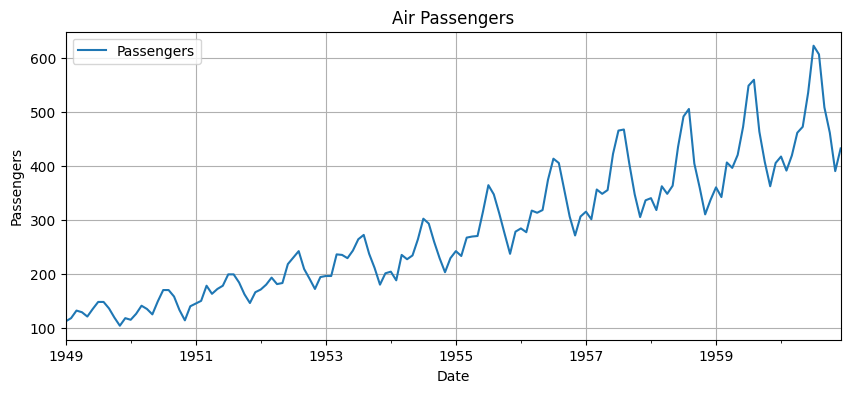

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import warnings

warnings.filterwarnings("ignore")


# Load the AirPassengers dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/airline-passengers.csv"
df = pd.read_csv(url, parse_dates=['Month'], index_col='Month')

# Visualize the series
df.plot(figsize=(10, 4), title="Air Passengers")
plt.xlabel("Date")
plt.ylabel("Passengers")
plt.grid()
plt.show()

# Split Data

In [2]:
def create_time_series_features(data, lookback_window=12):
    """
    Create features for time series forecasting using lagged values
    """
    X, y = [], []
    
    for i in range(lookback_window, len(data)):
        # Use previous 'lookback_window' values as features
        X.append(data[i-lookback_window:i])
        y.append(data[i])
    
    return np.array(X), np.array(y)

In [3]:
lag = 12
X = df['Passengers'][:-lag]
y = df['Passengers'][lag:]

# Define sizes
n = len(X)
train_size = int(n * 0.7)
val_size = int(n * 0.15)
test_size = n - train_size - val_size

# Split the series
X_train = X[:train_size]
y_train = y[:train_size]
X_val = X[train_size:train_size + val_size]
y_val = y[train_size:train_size + val_size]
X_test = X[train_size + val_size:]
y_test = y[train_size + val_size:]

# Confirm sizes
print(f"Train starts on: {X_train.index[0]}, Train ends on: {X_train.index[-1]}")
print(f"Validation starts on: {X_val.index[0]}, Validation ends on: {X_val.index[-1]}")
print(f"Test starts on: {X_test.index[0]}, Test ends on: {X_test.index[-1]}")
print(f"Train size: {len(X_train)}, Val size: {len(X_val)}, Test size: {len(X_test)}")

Train starts on: 1949-01-01 00:00:00, Train ends on: 1956-08-01 00:00:00
Validation starts on: 1956-09-01 00:00:00, Validation ends on: 1958-03-01 00:00:00
Test starts on: 1958-04-01 00:00:00, Test ends on: 1959-12-01 00:00:00
Train size: 92, Val size: 19, Test size: 21


In [4]:
from sklearn.preprocessing import StandardScaler

# Scale the features
scaler_X = StandardScaler()
scaler_y = StandardScaler()

X_train_scaled = scaler_X.fit_transform(np.array(X_train).reshape(-1,1))
X_val_scaled = scaler_X.transform(np.array(X_val).reshape(-1,1))
y_train_scaled = scaler_y.fit_transform(np.array(y_train).reshape(-1, 1)).ravel()
y_val_scaled = scaler_y.transform(np.array(y_val).reshape(-1, 1)).ravel()


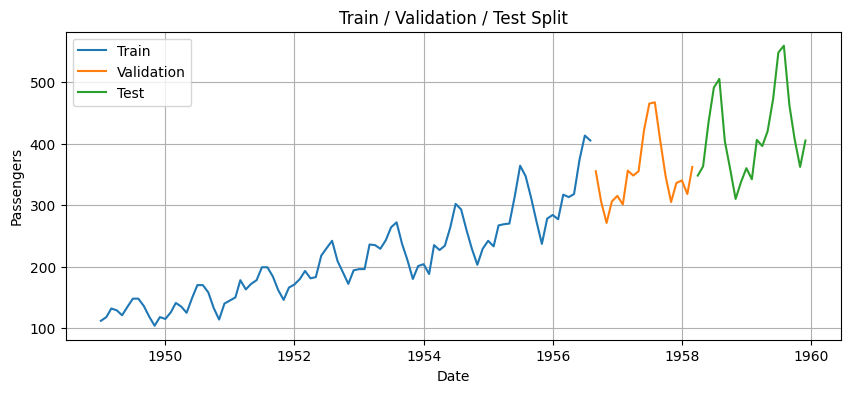

In [5]:
plt.figure(figsize=(10, 4))
plt.plot(X_train, label="Train")
plt.plot(X_val, label="Validation")
plt.plot(X_test, label="Test")
plt.title("Train / Validation / Test Split")
plt.xlabel("Date")
plt.ylabel("Passengers")
plt.legend()
plt.grid()
plt.show()

# Base Models

In [6]:
from abc import ABC, abstractmethod
from statsmodels.tsa.arima.model import ARIMA
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from copy import deepcopy

class AbstractBaseModel (ABC):

    def __init__(self, model, hparams, *args, **kwagrs):
        self.model = model
        self.hparams = hparams
        self.fitness_score = 0.0
        self.forecast = None

    @abstractmethod
    def train(self, X_train, y_train):
        raise NotImplementedError("Subclasses must implement train method")

    @abstractmethod
    def predict(self, X_test):
        raise NotImplementedError("Subclasses must implement predict method")

    @abstractmethod
    def get_name(self):
        raise NotImplementedError("Subclasses must implement get_name method")
    
    @abstractmethod
    def crossover(self, other):
        raise NotImplementedError("Subclasses must implement crossover method")

    @abstractmethod
    def mutate(self):
        raise NotImplementedError("Subclasses must implement mutate method")
    
    def calculate_fitness(self, pred, y_test, diversity_score):
        alpha = 0.9
        beta = 0.1
        self.fitness_score = (alpha * 1/(np.sqrt(mean_squared_error(y_test, pred)) + 1e-8)) + (beta * diversity_score)
        return self.fitness_score
    
    def __str__(self):
        return str(type(self).__name__) + ' ' + str(self.hparams) + ' Fitness: ' + str(self.fitness_score)
    
    def __repr__(self):
        return str(type(self).__name__) + ' ' + str(self.hparams) + ' Fitness: ' + str(self.fitness_score)


class ArimaModel(AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
    
    def train(self, X_train, y_train):
        p = self.hparams['p']
        d = self.hparams['d']
        q = self.hparams['q']
        self.model = ARIMA(X_train, order=(p, d, q)).fit()
    
    def predict(self, X_test):
        self.forecast = self.model.forecast(steps=len(X_test))
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'arima'
    
    def crossover(self, other):
        if not isinstance(other, ArimaModel):
            raise ValueError("Can only crossover with another ArimaModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            child1.hparams['p'], child2.hparams['p'] = child2.hparams['p'], child1.hparams['p']
        if np.random.random() < 0.5:
            child1.hparams['d'], child2.hparams['d'] = child2.hparams['d'], child1.hparams['d']
        if np.random.random() < 0.5:
            child1.hparams['q'], child2.hparams['q'] = child2.hparams['q'], child1.hparams['q']
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['p', 'd', 'q'])
        
        if mutation_param == 'p':
            self.hparams['p'] = np.random.randint(0, 5)
        elif mutation_param == 'd':
            self.hparams['d'] = np.random.randint(0, 2)
        elif mutation_param == 'q':
            self.hparams['q'] = np.random.randint(0, 5)
        
        self.fitness_score = 0.0
        
        return self

class SVRModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        kernel = self.hparams['kernel']
        c = self.hparams['c']
        gamma = self.hparams['gamma']
        epsilon = self.hparams['epsilon']
        self.model = SVR(kernel=kernel, C=c, gamma=gamma, epsilon=epsilon)
        self.model.fit(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = self.model.predict(X_test)
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'svr'
    
    def crossover(self, other):
        if not isinstance(other, SVRModel):
            raise ValueError("Can only crossover with another SVRModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            child1.hparams['kernel'], child2.hparams['kernel'] = child2.hparams['kernel'], child1.hparams['kernel']
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            c1, c2 = child1.hparams['c'], child2.hparams['c']
            child1.hparams['c'] = alpha * c1 + (1 - alpha) * c2
            child2.hparams['c'] = alpha * c2 + (1 - alpha) * c1
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            eps1, eps2 = child1.hparams['epsilon'], child2.hparams['epsilon']
            child1.hparams['epsilon'] = alpha * eps1 + (1 - alpha) * eps2
            child2.hparams['epsilon'] = alpha * eps2 + (1 - alpha) * eps1
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['kernel', 'c', 'epsilon'])
        
        if mutation_param == 'kernel':
            self.hparams['kernel'] = np.random.choice(["linear", "rbf", "poly"])
        
        elif mutation_param == 'c':
            current_c = self.hparams['c']
            noise = np.random.normal(0, current_c * 0.1)  # 10% noise
            self.hparams['c'] = max(0.1, min(100, current_c + noise))
        
        elif mutation_param == 'epsilon':
            current_eps = self.hparams['epsilon']
            noise = np.random.normal(0, current_eps * 0.1)  # 10% noise
            self.hparams['epsilon'] = max(0.001, min(0.5, current_eps + noise))

        self.fitness_score = 0.0
        
        return self
    
class MLPModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        hidden_layer_sizes = self.hparams['hidden_layer_sizes']
        learning_rate = self.hparams['learning_rate']
        
        hidden_layer_sizes = (int(hidden_layer_sizes),)
        
        self.model = MLPRegressor(hidden_layer_sizes=hidden_layer_sizes,
                            learning_rate_init=learning_rate,
                            max_iter=500, random_state=42)
        self.model.fit(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = self.model.predict(X_test)
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'mlp'
    
    def crossover(self, other):
        if not isinstance(other, MLPModel):
            raise ValueError("Can only crossover with another MLPModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            h1, h2 = child1.hparams['hidden_layer_sizes'], child2.hparams['hidden_layer_sizes']
            child1.hparams['hidden_layer_sizes'] = int(alpha * h1 + (1 - alpha) * h2)
            child2.hparams['hidden_layer_sizes'] = int(alpha * h2 + (1 - alpha) * h1)
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            lr1, lr2 = child1.hparams['learning_rate'], child2.hparams['learning_rate']
            child1.hparams['learning_rate'] = alpha * lr1 + (1 - alpha) * lr2
            child2.hparams['learning_rate'] = alpha * lr2 + (1 - alpha) * lr1
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['hidden_layer_sizes', 'learning_rate'])
        
        if mutation_param == 'hidden_layer_sizes':
            current_size = self.hparams['hidden_layer_sizes']
            change = np.random.randint(-10, 11)  # Change by -10 to +10
            self.hparams['hidden_layer_sizes'] = max(5, min(50, current_size + change))
        
        elif mutation_param == 'learning_rate':
            current_lr = self.hparams['learning_rate']
            noise = np.random.normal(0, current_lr * 0.1)  # 10% noise
            self.hparams['learning_rate'] = max(0.001, min(0.1, current_lr + noise))

        self.fitness_score = 0.0
        
        return self

    
class EnsembleModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        for model in self.hparams.keys():
            self.hparams[model].train(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = 0.0
        for model in self.hparams.keys():
            self.forecast += self.hparams[model].predict(X_test)
        self.forecast /= len(self.hparams.keys()) # Average of all predictions
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'ensemble'
    
    def crossover(self, other):
        return self, other
    
    def mutate(self):
        return self


# Model Diversity and Evaluation

In [7]:
def print_population(population):
    for model in population.keys():
        for individual in population[model]:
            print(individual)
    print('============================\n\n')


def init_population(population_size, pool_of_models):
    population = {}

    for model in pool_of_models:
        population[model.get_name()] = []
        if model is ArimaModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    ArimaModel(
                        ARIMA,
                        {
                            'p': np.random.randint(0, 5),
                            'd': np.random.randint(0, 2),
                            'q': np.random.randint(0, 5)
                        }
                    )
                )
        elif model is SVRModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    SVRModel(
                        SVR,
                        {
                            'kernel' : np.random.choice(["linear", "rbf", "poly"]),
                            'c' : np.random.uniform(0.1, 100),
                            'gamma': np.random.choice(['scale']),
                            'epsilon' : np.random.uniform(0.001, 0.5)
                        }
                    )
                )
        elif model is MLPModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    MLPModel(
                        MLPRegressor,
                        {
                            'hidden_layer_sizes': np.random.randint(5, 50),
                            'learning_rate': np.random.uniform(0.001, 0.1)
                        }
                    )
                )
    
    return population

In [8]:
from itertools import zip_longest


def individual_diversity(population, X_test):
    
    # Get predictions from all models
    model_predictions = {}
    model_names = []
    
    # print("Generating predictions from individual models...")
    for model in population.keys():
        model_names.append(model)
        model_predictions[model] = []
        for individual in population[model]:
            model_predictions[model].append(individual.predict(X_test))
    
    # Convert to numpy array for easier computation
    pred_matrix = [list(lst) for lst in zip_longest(*model_predictions.values(), fillvalue=None)]
    
    # Calculate pairwise disagreements using MSE
    n_rows, n_cols = np.shape(pred_matrix)[0:2]
    disagreement_matrix = np.zeros((n_rows, n_cols))

    for i in range(n_rows):  # For each model instance (row)
        for j in range(n_cols):  # For each model type (column)
            ref_pred = pred_matrix[i][j]
            mse_list = []
            for k in range(n_cols):
                if k != j:
                    comp_pred = pred_matrix[i][k]
                    mse = mean_squared_error(ref_pred, comp_pred)
                    mse_list.append(mse)
            disagreement_matrix[i][j] = np.mean(mse_list)
    
    return disagreement_matrix

In [9]:
def individual_evaluation_with_diversity(population, X_train, y_train, X_val, y_val):

    for model in population.keys():
        for individual in population[model]:
            individual.train(X_train, y_train)
            pred = individual.predict(X_val)
            # individual.calculate_fitness(pred, y_val)

    disagreement_matrix = individual_diversity(population, X_val)

    i = 0
    for model in population.keys():
        j = 0
        for individual in population[model]:
            pred = individual.predict(X_val)
            individual.calculate_fitness(pred, y_val, disagreement_matrix[j][i])
            j +=1
        i += 1


In [10]:
def individual_evaluation(population, X_train, y_train, X_val, y_val):

    for model in population.keys():
        for individual in population[model]:
            individual.train(X_train, y_train)
            pred = individual.predict(X_val)
            individual.calculate_fitness(pred, y_val)


In [11]:
from itertools import combinations


def calculate_model_diversity(models_dict, X_test):
    """
    Calculate disagreement measure (diversity) for ensemble models using MSE.
    
    Parameters:
    -----------
    models_dict : dict
        Dictionary with model names as keys and trained model objects as values
        Format: {'model_name': model_object, ...}
    X_test : array-like
        Test data for generating predictions
    
    Returns:
    --------
    float : Average disagreement measure across all model pairs
    dict : Dictionary with detailed diversity metrics and model predictions
    """
    
    if len(models_dict) < 2:
        raise ValueError("Need at least 2 models to calculate diversity")
    
    # Get predictions from all models
    model_predictions = {}
    model_names = []
    
    # print("Generating predictions from individual models...")
    for model_name, model_obj in models_dict.items():
        predictions = model_obj.predict(X_test)
        model_predictions[model_name] = predictions
        model_names.append(model_name)
        # print(f"  {model_name}: predictions generated")
    
    # Convert to numpy array for easier computation
    pred_matrix = np.column_stack([model_predictions[name] for name in model_names])
    n_models = len(model_names)
    
    # Calculate pairwise disagreements using MSE
    pairwise_disagreements = []
    disagreement_matrix = np.zeros((n_models, n_models))
    model_pairs = []
    
    # print("\nCalculating pairwise disagreements...")
    for i, j in combinations(range(n_models), 2):
        model_i = model_names[i]
        model_j = model_names[j]
        pred_i = pred_matrix[:, i]
        pred_j = pred_matrix[:, j]
        
        disagreement = mean_squared_error(pred_i, pred_j)
        pairwise_disagreements.append(disagreement)
        disagreement_matrix[i, j] = disagreement
        disagreement_matrix[j, i] = disagreement  # Symmetric matrix
        model_pairs.append((model_i, model_j))
        
        # print(f"  {model_i} vs {model_j}: MSE = {disagreement:.6f}")
    
    # Calculate overall diversity measure
    avg_disagreement = np.mean(pairwise_disagreements)
    
    # Additional diversity statistics
    diversity_stats = {
        'average_disagreement': avg_disagreement,
        'pairwise_disagreements': pairwise_disagreements,
        'disagreement_matrix': disagreement_matrix,
        'model_pairs': model_pairs,
        'min_disagreement': np.min(pairwise_disagreements),
        'max_disagreement': np.max(pairwise_disagreements),
        'std_disagreement': np.std(pairwise_disagreements),
        'n_pairs': len(pairwise_disagreements),
        'model_names': model_names,
        'individual_predictions': model_predictions
    }
    
    return avg_disagreement, diversity_stats

In [12]:
def plot_forecasts(models, actual):
    plt.figure(figsize=(10, 4))
    plt.plot(actual, label='Actual')
    for model in models:
        plt.plot(model.forecast, label= model.get_name())
    # plt.xlabel("Date")
    # plt.ylabel("Passengers")
    plt.grid()
    plt.legend()
    plt.show()


In [13]:
def team_evaluation(population, X_test, y_test):
    alpha = 0.8
    beta = 0.2

    best_models = {}
    # Select the best individual of each subpopulation
    for model in population.keys():
        best_ind = None
        for individual in population[model]:
            best_ind = individual if best_ind is None or individual.fitness_score > best_ind.fitness_score else best_ind
        
        best_models[best_ind.get_name()] = best_ind
    
    ensemble = EnsembleModel(None, best_models)
    pred = ensemble.predict(X_test)

    models = best_models.copy()
    models['ensemble'] = ensemble
    plot_forecasts(models.values(), y_test)

    diversity_score, _ = calculate_model_diversity(best_models, X_test)
    fitness_score = (alpha * (1/(np.sqrt(mean_squared_error(pred, y_test) + 1e-8)))) + (beta * diversity_score)

    return fitness_score, best_models, pred, ensemble


# Genetic Algorithm Operators

In [14]:
from copy import deepcopy


def tournament_selection(population, tournament_size=3):
    selected_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        population_size = len(model_list)
        selected_population[model_type] = []
        
        # Perform tournament selection to maintain population size
        for _ in range(population_size):
            # Randomly select tournament_size individuals
            tournament_indices = np.random.choice(population_size, 
                                                size=min(tournament_size, population_size), 
                                                replace=False)
            
            # Find the individual with highest fitness in the tournament
            best_individual = None
            best_fitness = -1
            
            for idx in tournament_indices:
                individual = model_list[idx]
                if individual.fitness_score > best_fitness:
                    best_fitness = individual.fitness_score
                    best_individual = individual
            
            # Add a deep copy to avoid reference issues
            selected_population[model_type].append(deepcopy(best_individual))
    
    return selected_population

In [15]:
from copy import deepcopy

def random_selection(population):
    selected_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        population_size = len(model_list)
        selected_population[model_type] = []
        
        # Perform random selection to maintain population size
        for _ in range(population_size):
            # Randomly select one individual from the population
            random_index = np.random.choice(population_size)
            selected_individual = model_list[random_index]
            selected_population[model_type].append(deepcopy(selected_individual))
    
    return selected_population

In [16]:
def crossover(population, crossover_rate=0.8):
    new_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        population_size = len(model_list)
        new_population[model_type] = []
        
        # Process pairs of individuals
        for i in range(0, population_size - 1, 2):
            parent1 = model_list[i]
            parent2 = model_list[i + 1]
            
            # Decide whether to perform crossover
            if np.random.random() < crossover_rate:
                # Use the crossover method of the object
                child1, child2 = parent1.crossover(parent2)
                new_population[model_type].extend([child1, child2])
            else:
                # No crossover, just copy parents
                new_population[model_type].extend([deepcopy(parent1), deepcopy(parent2)])
        
        # Handle odd population size
        if population_size % 2 == 1:
            new_population[model_type].append(deepcopy(model_list[-1]))
    
    return new_population

In [17]:
def mutation(population, mutation_rate=0.2):
    mutated_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        mutated_population[model_type] = []
        
        for individual in model_list:
            # Decide whether to mutate this individual
            if np.random.random() < mutation_rate:
                # Use the mutate method of the object
                mutated_individual = individual.mutate()
                mutated_population[model_type].append(mutated_individual)
            else:
                # No mutation, just copy the individual
                mutated_population[model_type].append(deepcopy(individual))
    
    return mutated_population

# Cooperative CoEvolutional Algorithm

Initializing population...
Population created: 
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 0.0
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 0.0
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 0.0
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 0.0
ArimaModel {'p': 0, 'd': 0, 'q': 1} Fitness: 0.0
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 0.0
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.0
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 0.0
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.0
ArimaModel {'p': 2, 'd': 0, 'q': 4} Fitness: 0.0
SVRModel {'kernel': 'poly', 'c': 89.76615005545042, 'gamma': 'scale', 'epsilon': 0.3978196150792081} Fitness: 0.0
SVRModel {'kernel': 'rbf', 'c': 58.42729196976643, 'gamma': 'scale', 'epsilon': 0.22474648873292308} Fitness: 0.0
SVRModel {'kernel': 'linear', 'c': 73.10550256401562, 'gamma': 'scale', 'epsilon': 0.4480850871024164} Fitness: 0.0
SVRModel {'kernel': 'poly', 'c': 0.5965815217284753, 'gamma': 'scale', 'epsilon': 0.15371537902933133} Fitness: 0.0
SV

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.2625807133651175
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.0563935696218125
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0901170807511704
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.9684368336978977
ArimaModel {'p': 0, 'd': 0, 'q': 1} Fitness: 0.9348820306045179
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 2.163829881204437
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.434258173794904
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6369529293972904
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 1.8324311224994319
ArimaModel {'p': 2, 'd': 0, 'q': 4} Fitness: 1.2191001247309408
SVRModel {'kernel': 'poly', 'c': 89.76615005545042, 'gamma': 'scale', 'epsilon': 0.3978196150792081} Fitness: 1.3446536109555858
SVRModel {'kernel': 'rbf', 'c': 58.42729196976643, 'gamma': 'scale', 'epsilon': 0.22474648873292308} Fitness: 1.367528657262713
SVRModel {'kernel': 'linear', 'c': 73.10550256401562, 'gamma': 'scale', 'epsilon': 0.4480850871024164} Fi

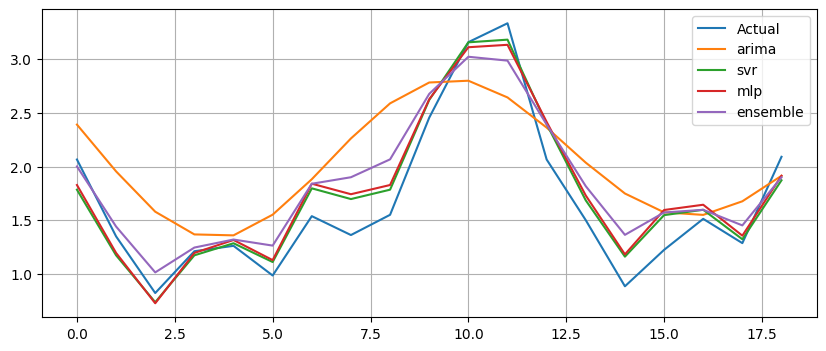

Generation 1: Fitness = 2.79004




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8408995925173495
ArimaModel {'p': 0, 'd': 0, 'q': 1} Fitness: 0.787287084291558
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0874679784662071
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.431631953881687
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.865511786979005
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.938075958425224
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0774197289121794
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 2.0107356002177257
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.6538627063547233
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0899456168977197
SVRModel {'kernel': 'linear', 'c': 75.00068878011767, 'gamma': 'scale', 'epsilon': 0.4480850871024164} Fitness: 4.4676726585948945
SVRModel {'kernel': 'rbf', 'c': 88.19405433148331, 'gamma': 'scale', 'epsilon': 0.38533643817247804} Fitness: 1.6097488959652817
SVRModel {'kernel': 'linear', 'c': 44.400922714705665, 'gamma': 'scale', 'epsilon': 0.4480850871024164} 

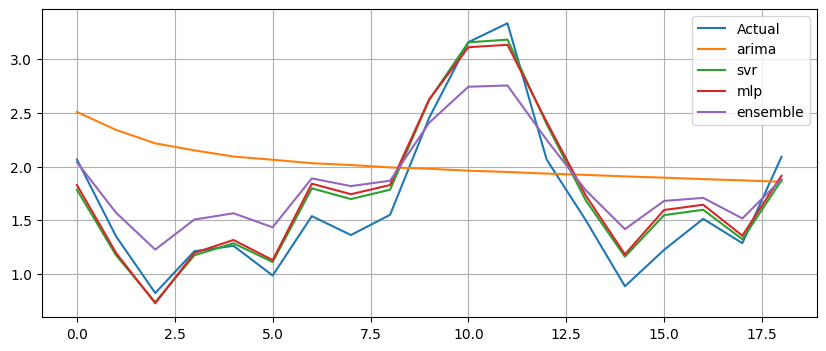

Generation 2: Fitness = 2.39416


ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.846633758266062
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0824241772921899
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.6034201610742254
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.09708513122581
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0932341998212476
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.084301946412367
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.0377629288816723
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 1.422266394957065
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9311572490918261
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.8593463940320119
SVRModel {'kernel': 'linear', 'c': 44.400922714705665, 'gamma': 'scale', 'epsilon': 0.4480850871024164} Fitness: 4.461553026296985
SVRModel {'kernel': 'rbf', 'c': 57.71460720101148, 'gamma': 'scale', 'epsilon': 0.3282305770254486} Fitness: 1.4820813821489964
SVRModel {'kernel': 'poly', 'c': 58.85742480149179, 'gamma': 'scale', 'e

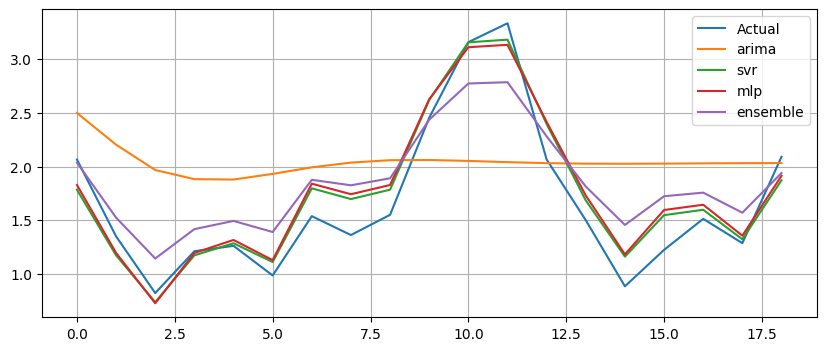

Generation 3: Fitness = 2.43357


ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0778145528566103
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2388301628396001
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0826406879118826
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8477824369031645
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0900243969743
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.0404250061419507
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.3920951980572462
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7338238343813037
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0765182591731048
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7478726376772133
SVRModel {'kernel': 'rbf', 'c': 48.82084867880223, 'gamma': 'scale', 'epsilon': 0.3282305770254486} Fitness: 1.4819745215001794
SVRModel {'kernel': 'linear', 'c': 57.811525562758405, 'gamma': 'scale', 'epsilon': 0.4480850871024164} Fitness: 4.421823335344734
SVRModel {'kernel': 'rbf', 'c': 88.37651938963228, 'gamma': 'scale', '

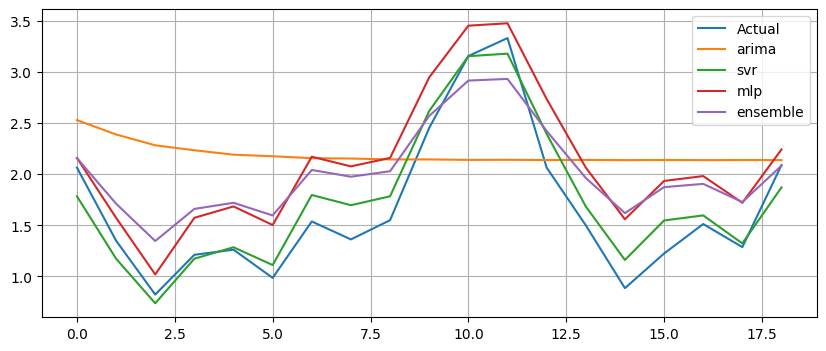

Generation 4: Fitness = 1.84108




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7364635211213182
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6407120256547192
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.087257441425625
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2432524179425906
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.8460449368734432
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0901492456794297
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0923869358017932
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.092193881290706
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.437801917018565
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0891036080812027
SVRModel {'kernel': 'poly', 'c': 57.42794864245202, 'gamma': 'scale', 'epsilon': 0.3282305770254486} Fitness: 1.431519442762902
SVRModel {'kernel': 'rbf', 'c': 49.10750723736169, 'gamma': 'scale', 'epsilon': 0.3282305770254486} Fitness: 1.4797134216859382
SVRModel {'kernel': 'rbf', 'c': 88.37651938963228, 'gamma': 'scale', 'epsilon': 0.3978196150792081} Fitness

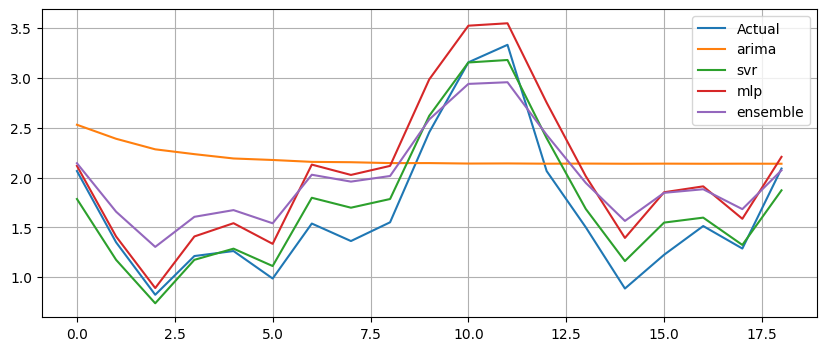

Generation 5: Fitness = 1.96681


ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0933180538534033
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0793732656518757
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8380539278047421
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.08759597722681
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.863153652401625
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.9050077342242653
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.75292346343371
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.751498708797719
ArimaModel {'p': 1, 'd': 1, 'q': 2} Fitness: 1.1018144744172247
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8419529274165594
SVRModel {'kernel': 'linear', 'c': 75.00068878011767, 'gamma': 'scale', 'epsilon': 0.44382038276695945} Fitness: 4.414526000332421
SVRModel {'kernel': 'rbf', 'c': 49.10750723736169, 'gamma': 'scale', 'epsilon': 0.3282305770254486} Fitness: 1.4712630658273635
SVRModel {'kernel': 'linear', 'c': 55.46089998774496, 'gamma': 'scale', '

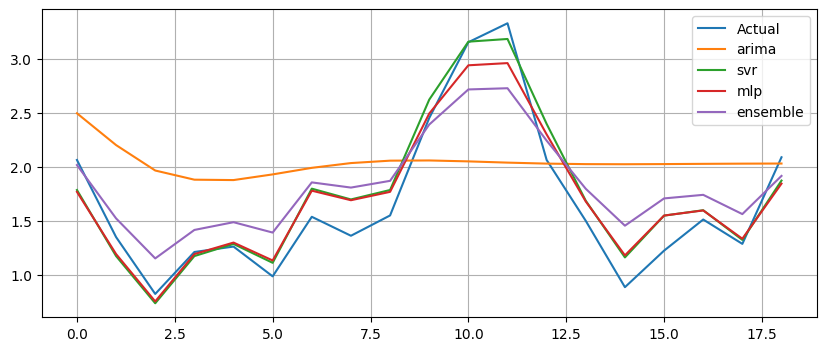

Generation 6: Fitness = 2.41523




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0916090470698252
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0929154510676393
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1513598808212149
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.6868751048523092
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.042770251691913
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1406972563802038
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7320046416574622
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8342493330511219
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.858432063869758
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 1.4506524566795633
SVRModel {'kernel': 'linear', 'c': 75.00068878011767, 'gamma': 'scale', 'epsilon': 0.4125595589748316} Fitness: 3.7394237299620885
SVRModel {'kernel': 'linear', 'c': 61.727421913401606, 'gamma': 'scale', 'epsilon': 0.33165815700377876} Fitness: 3.448768094911618
SVRModel {'kernel': 'linear', 'c': 60.34557607625936, 'gamma': 'scale', 'epsilon': 0.38680003717118

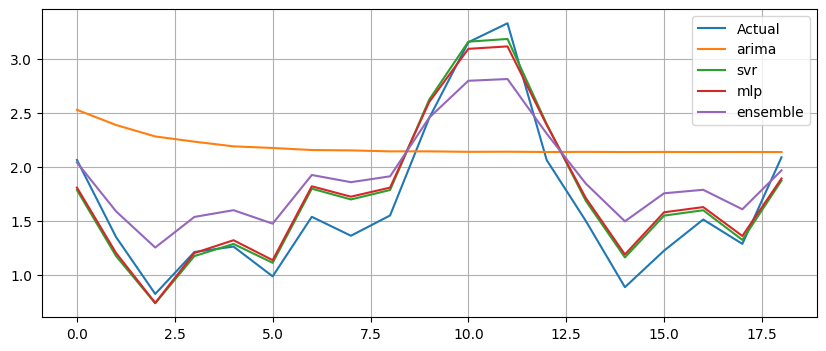

Generation 7: Fitness = 2.22880




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 1.423840004267236
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8412993897569171
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.085108755264237
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.153129304005092
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.086400286425102
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8407299468826032
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.6840725064891378
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0826637312002656
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0901599100246457
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8450316929765095
SVRModel {'kernel': 'poly', 'c': 61.727421913401606, 'gamma': 'scale', 'epsilon': 0.3021097065274918} Fitness: 1.3601597624873314
SVRModel {'kernel': 'linear', 'c': 61.727421913401606, 'gamma': 'scale', 'epsilon': 0.3116202746811095} Fitness: 3.2917039110518576
SVRModel {'kernel': 'linear', 'c': 61.727421913401606, 'gamma': 'scale', 'epsilon': 0.3133326479969504

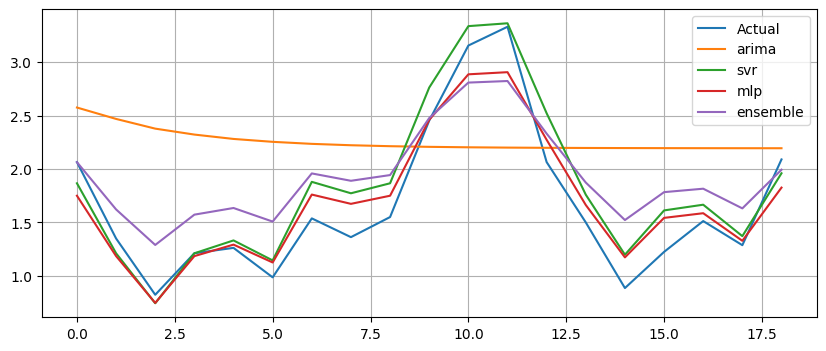

Generation 8: Fitness = 2.12164




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.0316825012053668
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.4374149692151745
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.8374606286058146
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.153129304005092
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8435765404427994
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8324217493051607
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.862165676238132
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8358175783673087
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0795023066181557
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 1.4623798595261668
SVRModel {'kernel': 'rbf', 'c': 61.727421913401606, 'gamma': 'scale', 'epsilon': 0.30396131646773256} Fitness: 1.4614417293609485
SVRModel {'kernel': 'poly', 'c': 64.69682386639442, 'gamma': 'scale', 'epsilon': 0.312411633442605} Fitness: 1.3961966794142198
SVRModel {'kernel': 'poly', 'c': 66.27481507012344, 'gamma': 'scale', 'epsilon': 0.33309188776054477} Fi

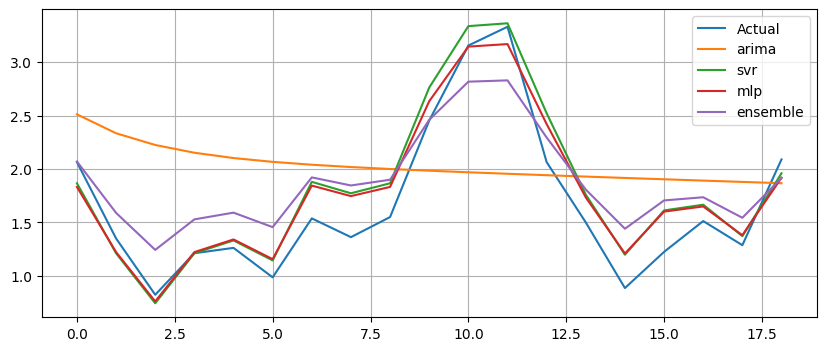

Generation 9: Fitness = 2.34592




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.5386547838382878
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0902980270525895
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0889342048800008
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.962885285030455
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8394953971497339
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.431815366673672
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8467795777329874
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.0433903956003814
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 1.4383432861966268
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1508977229074462
SVRModel {'kernel': 'poly', 'c': 66.27481507012344, 'gamma': 'scale', 'epsilon': 0.27547720738777937} Fitness: 1.563536684408994
SVRModel {'kernel': 'linear', 'c': 64.69682386639442, 'gamma': 'scale', 'epsilon': 0.312411633442605} Fitness: 3.2729092201213965
SVRModel {'kernel': 'linear', 'c': 64.61690819357179, 'gamma': 'scale', 'epsilon': 0.33309188776054477}

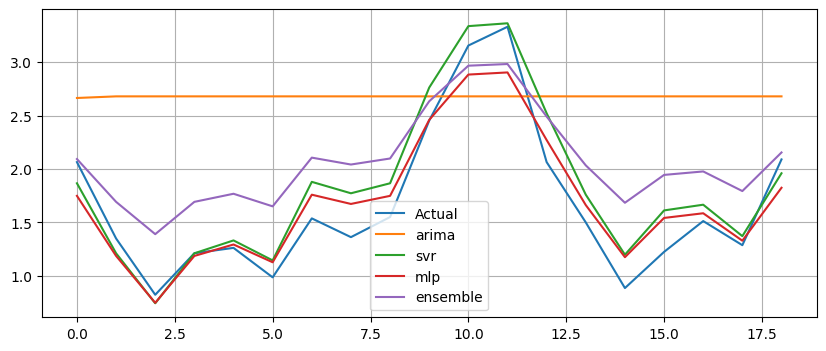

Generation 10: Fitness = 1.77166


ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7538666318097764
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.4475698232949374
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.090623891333981
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.435669560350364
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 1.8631538309999223
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.0327430117204692
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8351850079309062
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 1.8236431310081447
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8334241184330717
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8369771751203644
SVRModel {'kernel': 'poly', 'c': 62.256530852455676, 'gamma': 'scale', 'epsilon': 0.35517285332031423} Fitness: 1.4195068845695928
SVRModel {'kernel': 'poly', 'c': 62.256530852455676, 'gamma': 'scale', 'epsilon': 0.35517285332031423} Fitness: 1.4001160738269953
SVRModel {'kernel': 'linear', 'c': 62.256530852455676, 'gamma': '

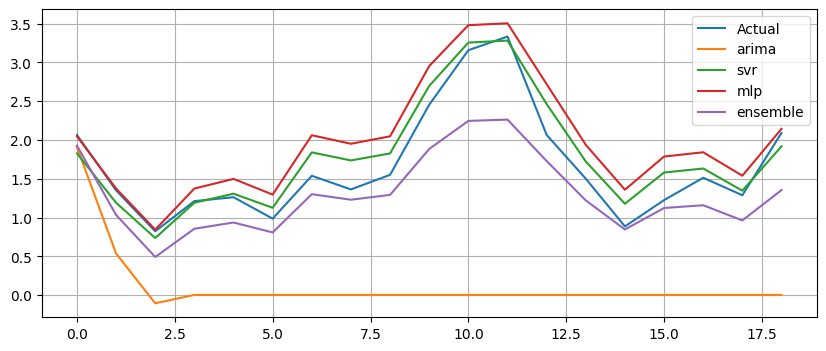

Generation 11: Fitness = 2.27140




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9512095879869866
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 1.4503505579553129
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.4356920421013966
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8282168490384908
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8448642090986165
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2378923685940637
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8392230248643379
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.977357900920774
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1711123710605815
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 1.435269274841842
SVRModel {'kernel': 'rbf', 'c': 70.54349726825235, 'gamma': 'scale', 'epsilon': 0.2968771306208516} Fitness: 1.6069364597677973
SVRModel {'kernel': 'poly', 'c': 62.256530852455676, 'gamma': 'scale', 'epsilon': 0.35517285332031423} Fitness: 1.4002502093841858
SVRModel {'kernel': 'poly', 'c': 62.256530852455676, 'gamma': 'scale', 'epsilon': 0.3405897763405097} F

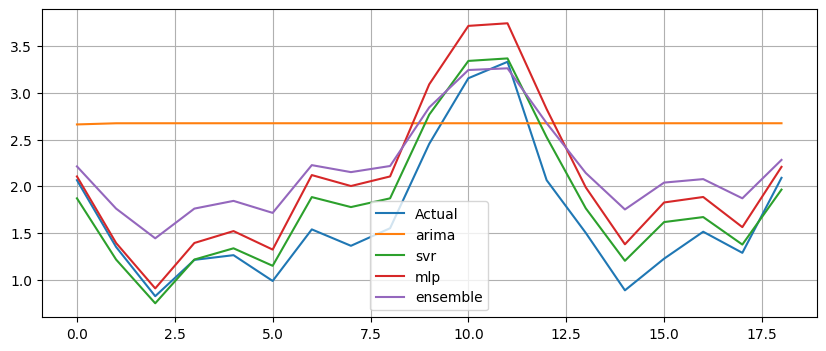

Generation 12: Fitness = 1.53400


ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 1.4024620822155318
ArimaModel {'p': 0, 'd': 0, 'q': 1} Fitness: 1.8617557440518806
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.4349016988156837
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9425149526364681
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8479911029634926
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 1.8153671650545917
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8437559419422166
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 1.8743226273480933
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8434955697016936
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.153961459502255
SVRModel {'kernel': 'poly', 'c': 62.256530852455676, 'gamma': 'scale', 'epsilon': 0.3405897763405097} Fitness: 1.3714101023971756
SVRModel {'kernel': 'poly', 'c': 62.256530852455676, 'gamma': 'scale', 'epsilon': 0.355926085561196} Fitness: 1.776344144885497
SVRModel {'kernel': 'poly', 'c': 63.449871454624514, 'gamma': 'scale

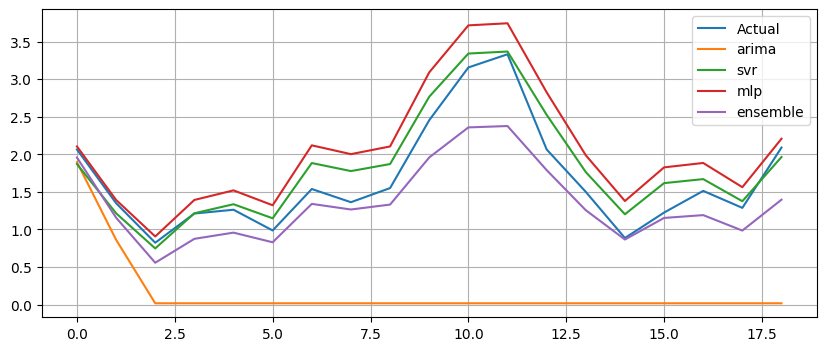

Generation 13: Fitness = 2.52669


ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9760722422589947
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 1.8753815299152192
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8174202899021248
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 1.8616769060464016
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8238404720092815
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 1.8356845767045544
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8317217344492407
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8479911029634926
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 1.430443140014706
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9275078223459501
SVRModel {'kernel': 'linear', 'c': 62.256530852455676, 'gamma': 'scale', 'epsilon': 0.3708521708064676} Fitness: 3.3782159794672397
SVRModel {'kernel': 'poly', 'c': 70.13013453900486, 'gamma': 'scale', 'epsilon': 0.3865992050181536} Fitness: 1.7944072365922776
SVRModel {'kernel': 'linear', 'c': 63.385013605801696, 'gamma': '

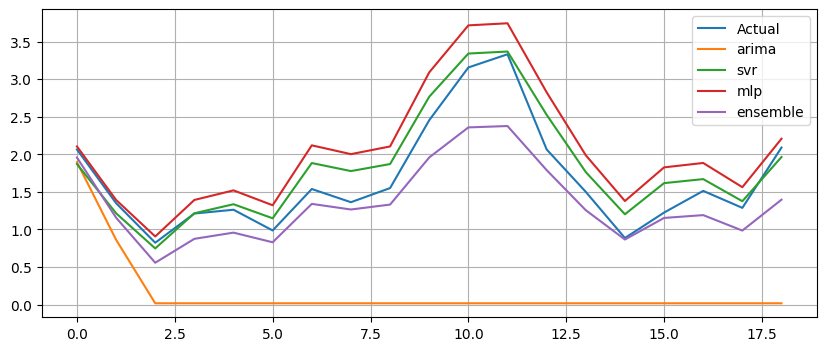

Generation 14: Fitness = 2.52669


ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9802178404360307
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8174718638974466
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8271984868676476
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 1.4306532803498484
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.4363161318917212
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.995693160578873
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 1.4526118991016261
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9801518857557354
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8321455837415868
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 1.8693887158039533
SVRModel {'kernel': 'linear', 'c': 63.385013605801696, 'gamma': 'scale', 'epsilon': 0.4015252902634252} Fitness: 3.7627135474235063
SVRModel {'kernel': 'linear', 'c': 70.13013453900486, 'gamma': 'scale', 'epsilon': 0.4015252902634252} Fitness: 3.6497916872747194
SVRModel {'kernel': 'linear', 'c': 63.449871454624514, 'gamma':

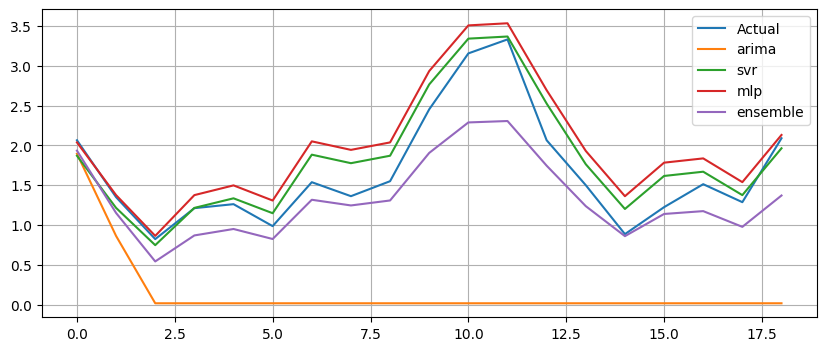

Generation 15: Fitness = 2.36957


ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9290958483325573
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.904334928205908
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.854654670751422
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8275015863829034
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9167553456520612
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8332097919274863
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 1.8714722797461039
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 1.416397635093718
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9382600107101159
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8460528658234948
SVRModel {'kernel': 'linear', 'c': 63.582712848481506, 'gamma': 'scale', 'epsilon': 0.39725188203417483} Fitness: 3.7193356099160524
SVRModel {'kernel': 'poly', 'c': 64.43381124687552, 'gamma': 'scale', 'epsilon': 0.3689965903678458} Fitness: 1.4556938876007661
SVRModel {'kernel': 'poly', 'c': 63.449871454624514, 'gamma': 'sca

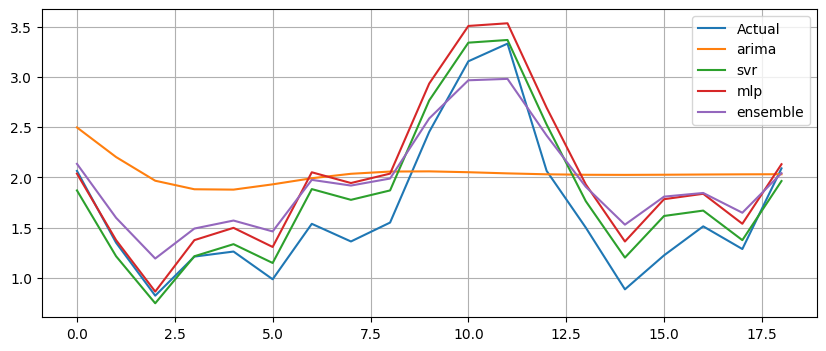

Generation 16: Fitness = 2.16729


ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8466242456579299
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8316688613128359
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8342592586492601
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.4351155980244807
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2370221364699236
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9433976994256817
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.4486109700917558
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 1.8231779299781221
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 1.423375798686886
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8425781995264976
SVRModel {'kernel': 'linear', 'c': 66.05868704135189, 'gamma': 'scale', 'epsilon': 0.3376851388338976} Fitness: 3.5192256629711243
SVRModel {'kernel': 'linear', 'c': 66.05868704135189, 'gamma': 'scale', 'epsilon': 0.3376851388338976} Fitness: 3.527606515923303
SVRModel {'kernel': 'linear', 'c': 69.9416255668579, 'gamma': 'sc

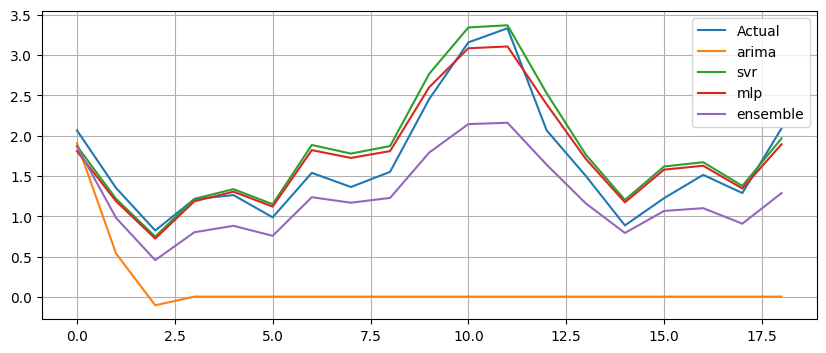

Generation 17: Fitness = 2.00642


ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.831603679652075
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.830673441597508
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 1.7956885031026093
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8285155473889678
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8261249628705369
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.857544113503893
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 1.416242515725897
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8088286210535961
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 1.7338664385203293
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8593173135642955
SVRModel {'kernel': 'linear', 'c': 63.394726906046806, 'gamma': 'scale', 'epsilon': 0.4015252902634252} Fitness: 3.653058336583895
SVRModel {'kernel': 'rbf', 'c': 63.4498257735427, 'gamma': 'scale', 'epsilon': 0.36499452497228646} Fitness: 1.564994708755429
SVRModel {'kernel': 'poly', 'c': 65.9048547942114, 'gamma': 'scale', 'e

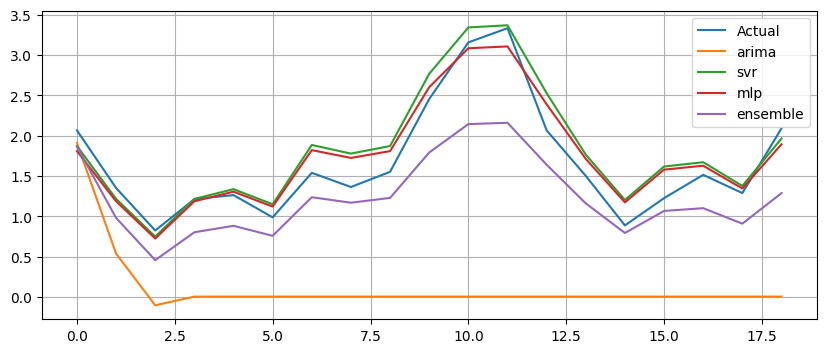

Generation 18: Fitness = 2.00613


ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 1.3711722965521513
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8672275718942839
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 1.4192019437051178
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.928143991393223
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5784536424554179
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.425743385911384
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9694242356255938
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.045014939672484
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8272001853928538
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 1.8139796927977598
SVRModel {'kernel': 'poly', 'c': 63.440158154379404, 'gamma': 'scale', 'epsilon': 0.3141635699438084} Fitness: 1.3585103674754484
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3376851388338976} Fitness: 3.6369380371187017
SVRModel {'kernel': 'poly', 'c': 63.44784315726984, 'gamma': 'scale'

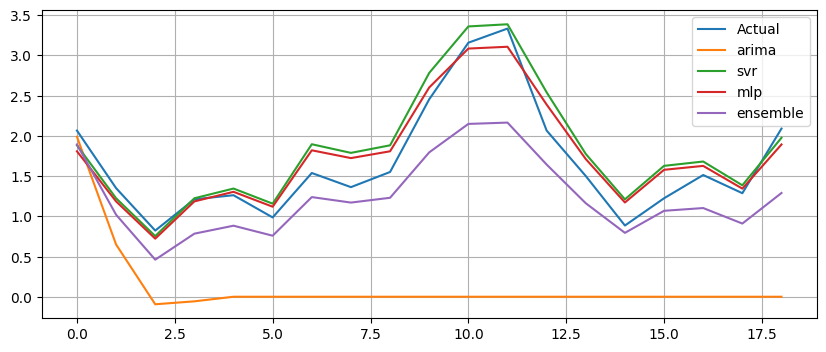

Generation 19: Fitness = 2.02276




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 1.8504794360967403
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7480899893081174
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.835218760106925
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8575441135083567
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2376855986000357
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9694242356255938
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.828003047747493
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7870636136756479
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1552490475533805
ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 1.7784542028953543
SVRModel {'kernel': 'poly', 'c': 63.394726906046806, 'gamma': 'scale', 'epsilon': 0.3668644291917326} Fitness: 1.800104440869578
SVRModel {'kernel': 'poly', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3376851388338976} Fitness: 1.4805911664875624
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3376851388338976} Fit

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


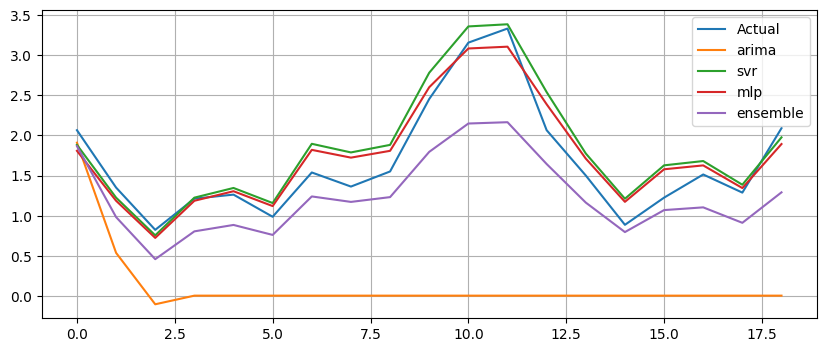

Generation 20: Fitness = 2.01967




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0845082502652912
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9717192403558039
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.8324727631498793
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7882715392423962
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.0809507706996297
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9676703612127284
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.4340374933779771
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7881434893951356
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.0435224517652328
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9497999470281888
SVRModel {'kernel': 'linear', 'c': 65.09303093265893, 'gamma': 'scale', 'epsilon': 0.36576469873737344} Fitness: 3.1835913577265544
SVRModel {'kernel': 'linear', 'c': 64.25198201593187, 'gamma': 'scale', 'epsilon': 0.34942085504173254} Fitness: 3.575943965244997
SVRModel {'kernel': 'linear', 'c': 63.443631651353584, 'gamma': 'scale', 'epsilon': 0.33351091796

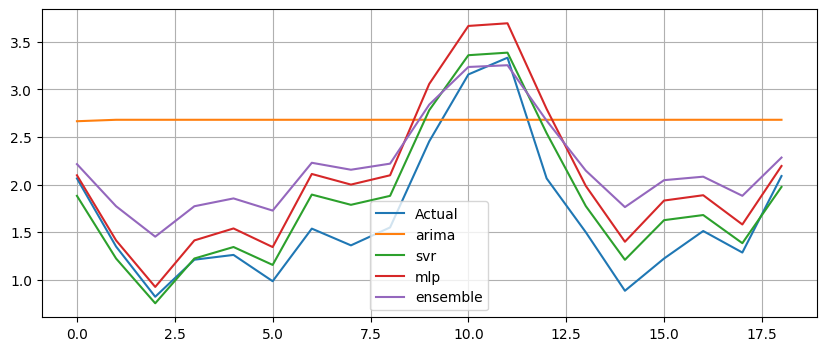

Generation 21: Fitness = 1.51609




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8089305770297711
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7892035287279972
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.0384815498003452
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.928204067286371
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0839810104481793
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0827630935040276
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.8314969805435043
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9906363710321877
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7889169373737772
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8275711943132941
SVRModel {'kernel': 'linear', 'c': 64.25933611130081, 'gamma': 'scale', 'epsilon': 0.33806585727126054} Fitness: 3.5302103488447076
SVRModel {'kernel': 'linear', 'c': 73.9583393331227, 'gamma': 'scale', 'epsilon': 0.3481794853853676} Fitness: 3.5104708354324954
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.322027249725439

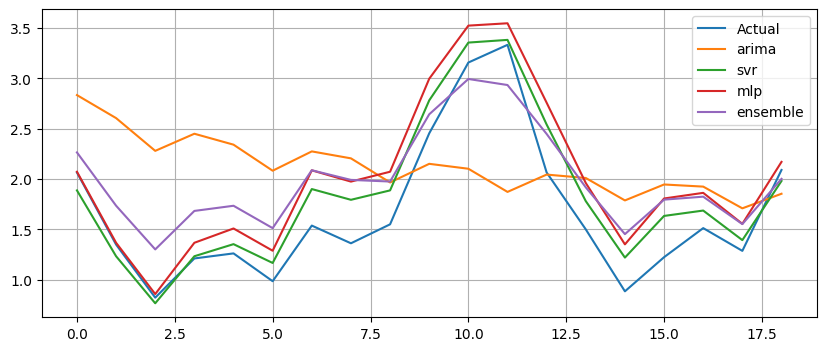

Generation 22: Fitness = 1.99169




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8068543348936996
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0835095357075506
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9462297861107617
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9730451734072465
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8280034840467785
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7898487382021827
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9718326853385751
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7903484568817635
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9631887777424564
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7889042464223097
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.36671977684620866} Fitness: 3.222799933651478
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.32363991378344603} Fitness: 3.3787059884131114
SVRModel {'kernel': 'linear', 'c': 66.00875118898333, 'gamma': 'scale', 'epsilon': 0.33768513883389

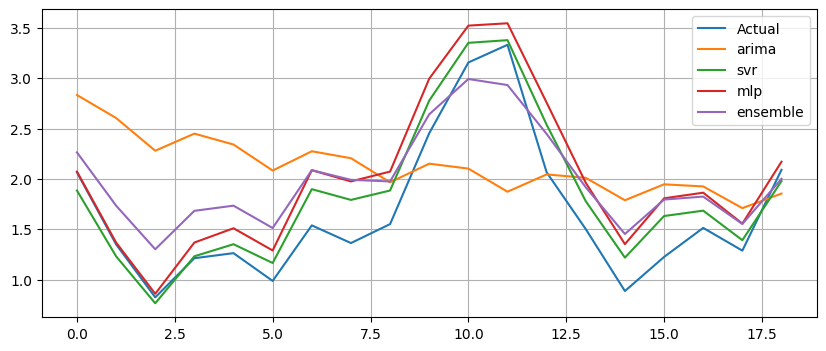

Generation 23: Fitness = 1.99523




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.9717209455897153
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8309780515479666
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8080064230025559
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.954479561863974
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8276756253196392
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8295206779686479
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8211269947215337
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9757515842607027
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0852855914346757
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9157452263120984
SVRModel {'kernel': 'linear', 'c': 63.443631651353584, 'gamma': 'scale', 'epsilon': 0.3335109179600012} Fitness: 3.6213684124024605
SVRModel {'kernel': 'linear', 'c': 57.43910677235952, 'gamma': 'scale', 'epsilon': 0.3335109179600012} Fitness: 3.49106228692809
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3283746610640248

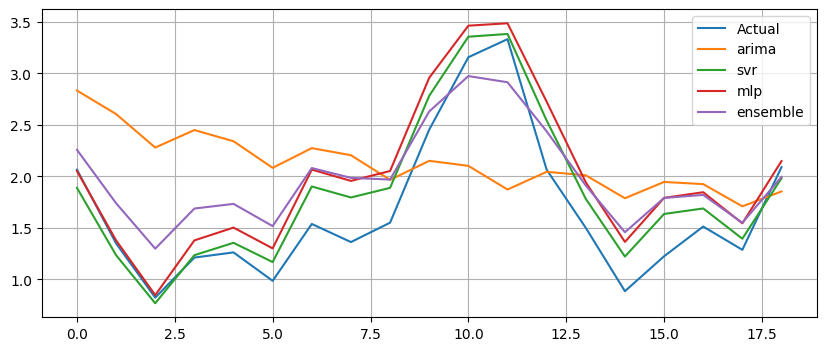

Generation 24: Fitness = 1.99326




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2477409841378868
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9703378893636365
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0860176287278769
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0851033238127075
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.9976059637513826
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8243128021926761
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9675132545702695
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8440925392549821
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.8717677799002468
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.9453012669043148
SVRModel {'kernel': 'linear', 'c': 63.443631651353584, 'gamma': 'scale', 'epsilon': 0.32425413965475447} Fitness: 3.3756537655317436
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3312840280306861} Fitness: 3.5912041455864183
SVRModel {'kernel': 'linear', 'c': 63.443631651353584, 'gamma': 'scale', 'epsilon': 0.33351091796

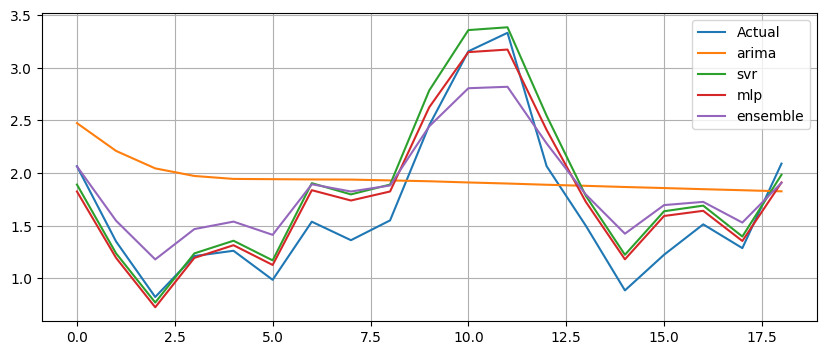

Generation 25: Fitness = 2.47113




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.919887244890643
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2557452028253213
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9173095024579225
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.961836758655577
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0812536192807751
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9372971614092791
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8373872424695452
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9155219576249127
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.94654047834996
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8269573995228539
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.32202724972543934} Fitness: 3.5053809180034214
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3312840280306861} Fitness: 3.4392814714082576
SVRModel {'kernel': 'linear', 'c': 68.25658426621136, 'gamma': 'scale', 'epsilon': 0.3321066476028327} 

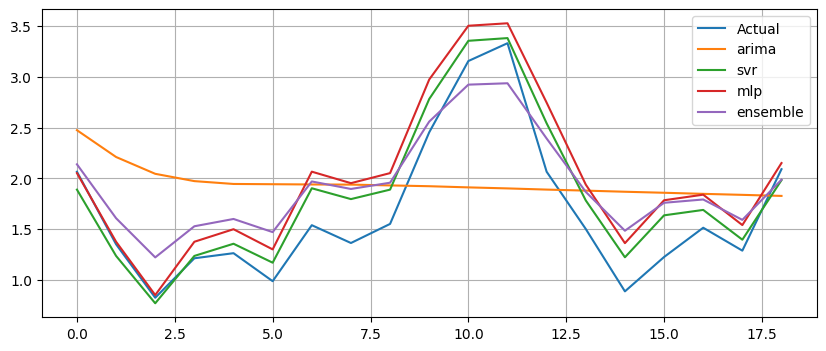

Generation 26: Fitness = 2.24031


ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9818813377815967
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9719275477268828
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.9740854844599756
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9275134460779689
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1588903149780752
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9700488087739916
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9429530399182843
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9400111036277932
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.092423726291009
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.244416108585277
SVRModel {'kernel': 'linear', 'c': 60.11887437053571, 'gamma': 'scale', 'epsilon': 0.3321066476028327} Fitness: 3.599753179645153
SVRModel {'kernel': 'linear', 'c': 68.16770029673641, 'gamma': 'scale', 'epsilon': 0.32202724972543934} Fitness: 3.513114141585734
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'sca

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


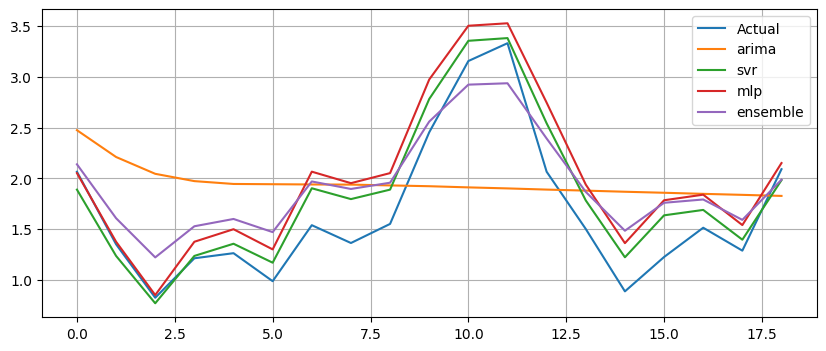

Generation 27: Fitness = 2.24031


ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.7623308934159292
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9564385942847307
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9116024411310261
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9905823647107248
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8422160910953141
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.940799939246006
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1529593779885015
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.8684302803827015
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1510027793380018
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1515957114011535
SVRModel {'kernel': 'poly', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3312840280306861} Fitness: 1.4568235084135597
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3312840280306861} Fitness: 3.441636015519894
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale'

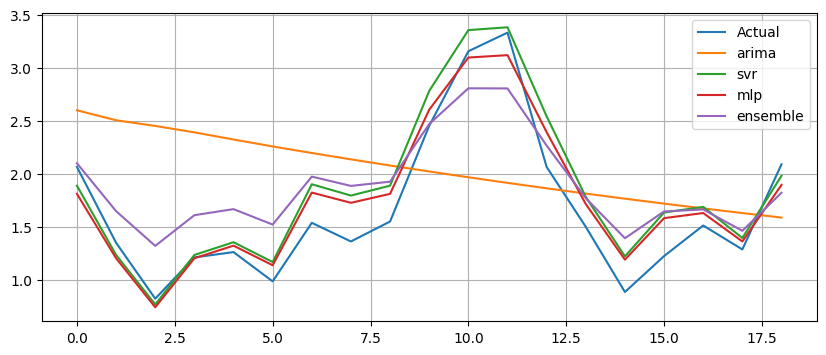

Generation 28: Fitness = 2.24876




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7882450356652706
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1882291672713565
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9144938148926207
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6249731984090323
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9917359734715518
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.047947728258628
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 1.7330880646385651
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8302457109362179
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1529775352982028
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9620257731137765
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.32345576597290693} Fitness: 3.409579616703
SVRModel {'kernel': 'poly', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3312840280306861} Fitness: 1.319297541489819
SVRModel {'kernel': 'linear', 'c': 62.77479901890604, 'gamma': 'scale', 'epsilon': 0.32254440379575594} Fit

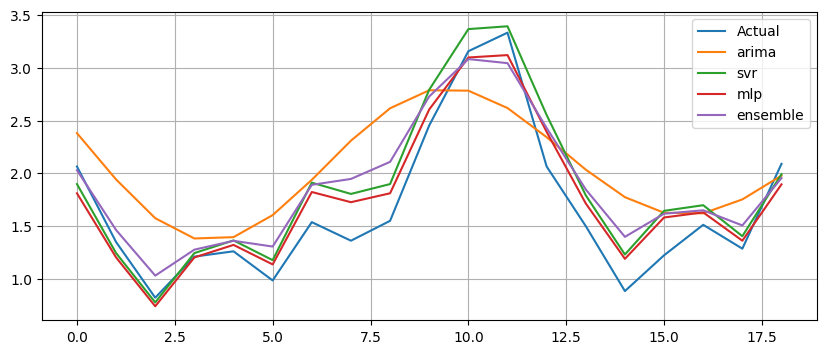

Generation 29: Fitness = 2.57457




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 1.3996858049310963
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7889869498020811
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.8702442076929009
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.8701552199247349
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6845954102024443
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.915847166679427
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 1.3885694200027663
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8071686021077791
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9273900221655595
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.199828937485235
SVRModel {'kernel': 'poly', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3226948787271382} Fitness: 1.3884286080957002
SVRModel {'kernel': 'linear', 'c': 60.91307496072787, 'gamma': 'scale', 'epsilon': 0.3312840280306861} Fitness: 3.477802200134774
SVRModel {'kernel': 'linear', 'c': 66.44395992873574, 'gamma': 'scale', 'epsilon': 0.3229386119025903} F

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


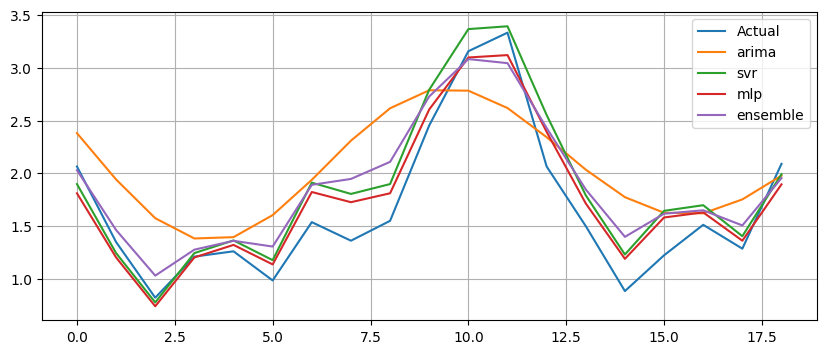

Generation 30: Fitness = 2.57457




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6274057497693133
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.2446980084053174
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7885835470550688
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8036903327087432
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8315067392356466
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 1.386868049342496
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9143885079992494
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5599443974205813
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 1.730946283233219
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 1.815806885216859
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3233309329913311} Fitness: 3.3417332746532296
SVRModel {'kernel': 'poly', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3228197117087141} Fitness: 1.3145229566681789
SVRModel {'kernel': 'linear', 'c': 60.91307496072787, 'gamma': 'scale', 'epsilon': 0.3312840280306861} Fi

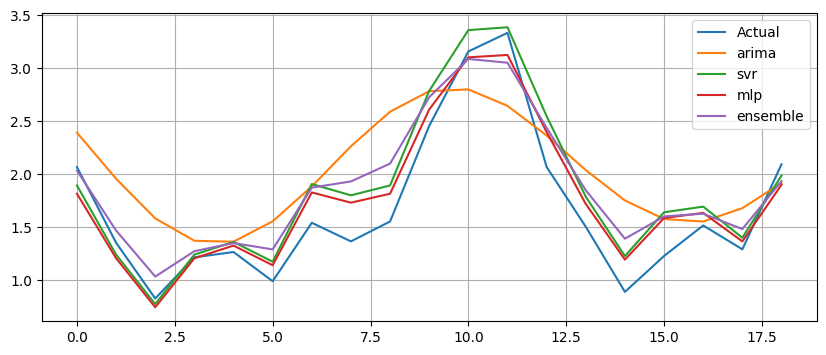

Generation 31: Fitness = 2.64983




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 1.3905197930026876
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5612381138504285
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7885835474427546
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8091948699369669
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1897999129219503
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6268608071825483
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.749042906945176
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8069800797672767
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.2003249114817005
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.686176769900306
SVRModel {'kernel': 'poly', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3226948787271382} Fitness: 1.3965321165816622
SVRModel {'kernel': 'poly', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.338710635567525} Fitness: 1.3880525409662428
SVRModel {'kernel': 'linear', 'c': 61.04925030623079, 'gamma': 'scale', 'epsilon': 0.3312840280306861} Fitn

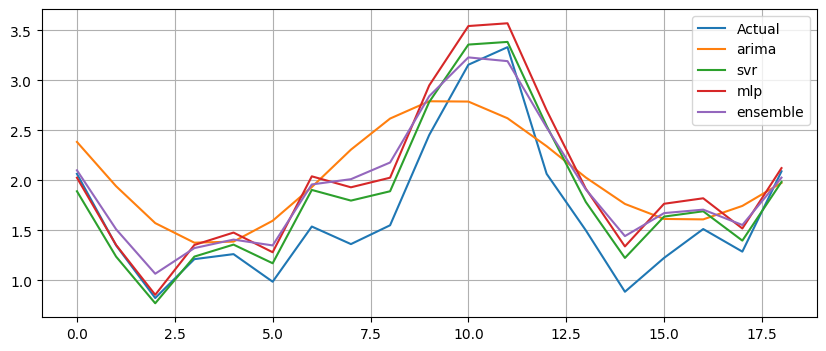

Generation 32: Fitness = 2.26584




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.6987176093289906
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1503544735274358
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9343303085716584
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8492742667222752
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.818697220206344
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9558713381192284
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.8079582638316856
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.767106056573081
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9562355546528528
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8103352180778567
SVRModel {'kernel': 'poly', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.3277588270413663} Fitness: 1.394628941900406
SVRModel {'kernel': 'linear', 'c': 61.04925030623079, 'gamma': 'scale', 'epsilon': 0.3312840280306861} Fitness: 3.4284992858251666
SVRModel {'kernel': 'linear', 'c': 65.9048547942114, 'gamma': 'scale', 'epsilon': 0.37709527019897476} F

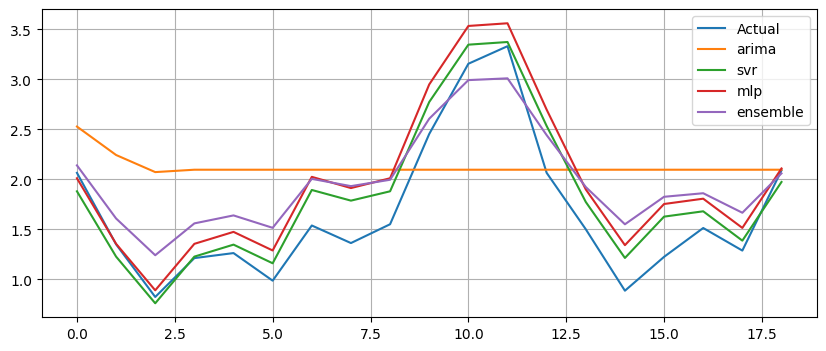

Generation 33: Fitness = 2.06712




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8529900533731574
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0780168420638563
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.0966653469317797
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.189043875160876
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1500281637007879
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.9317424110000176
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8150313661643834
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8087458815831233
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.0972532581635035
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5833432027111891
SVRModel {'kernel': 'linear', 'c': 64.51955262123533, 'gamma': 'scale', 'epsilon': 0.33588967189829594} Fitness: 3.4984431631060184
SVRModel {'kernel': 'rbf', 'c': 65.19235747528282, 'gamma': 'scale', 'epsilon': 0.37709527019897476} Fitness: 1.517273912804014
SVRModel {'kernel': 'linear', 'c': 61.04925030623079, 'gamma': 'scale', 'epsilon': 0.3419336931396926

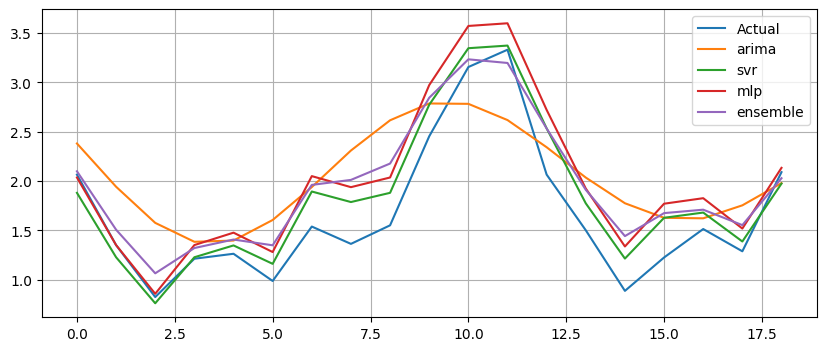

Generation 34: Fitness = 2.26618




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9138923924265132
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0882031287221803
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6336464698258772
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8092619133777695
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.0943256733660165
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8273764405765456
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8476781717561698
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8074015235191784
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6384121083112921
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9562355546528528
SVRModel {'kernel': 'linear', 'c': 61.04925030623079, 'gamma': 'scale', 'epsilon': 0.331989950332799} Fitness: 3.5886891883131447
SVRModel {'kernel': 'linear', 'c': 64.51955262123533, 'gamma': 'scale', 'epsilon': 0.33024463426353085} Fitness: 3.4288369287145533
SVRModel {'kernel': 'rbf', 'c': 65.19235747528282, 'gamma': 'scale', 'epsilon': 0.3770952701989747

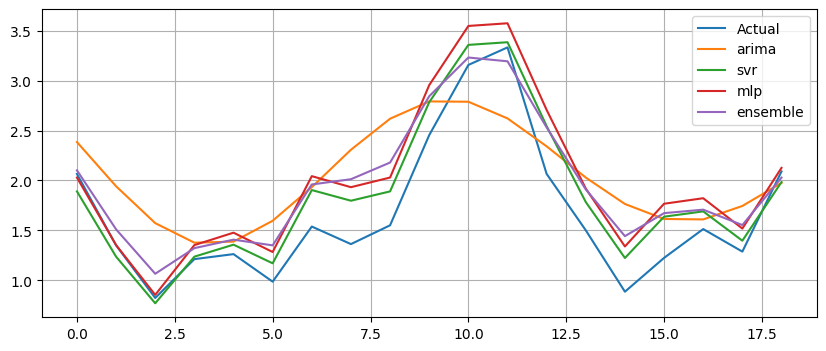

Generation 35: Fitness = 2.26445




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6388146749885355
ArimaModel {'p': 1, 'd': 0, 'q': 0} Fitness: 0.9849615965995172
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8549625422547309
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8087458975650782
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8505683976685117
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0910785841243547
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8431777633781354
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6260688616739805
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8078792405173676
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.798690883211834
SVRModel {'kernel': 'linear', 'c': 68.8441719793981, 'gamma': 'scale', 'epsilon': 0.4090700074369681} Fitness: 3.655660449239177
SVRModel {'kernel': 'linear', 'c': 68.8441719793981, 'gamma': 'scale', 'epsilon': 0.352334490735861} Fitness: 3.3562029327487743
SVRModel {'kernel': 'linear', 'c': 63.25709255722103, 'gamma': 'scale', 'epsilon': 0.3403955705846039} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


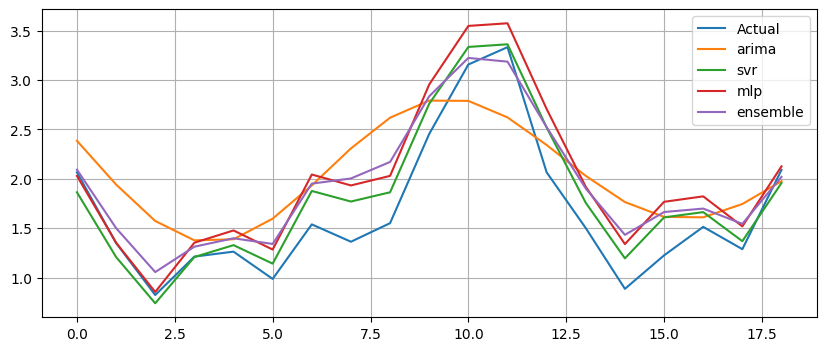

Generation 36: Fitness = 2.31198


ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.817497337431422
ArimaModel {'p': 1, 'd': 0, 'q': 0} Fitness: 0.9862834806621266
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8085979896067463
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8084973470296566
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0912960265976854
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1636758549416244
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8389571452597369
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.838817761510642
ArimaModel {'p': 1, 'd': 0, 'q': 0} Fitness: 0.9854714888633105
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.7958703960124305
SVRModel {'kernel': 'rbf', 'c': 66.63632972840786, 'gamma': 'scale', 'epsilon': 0.3419336931396926} Fitness: 1.538782142272819
SVRModel {'kernel': 'linear', 'c': 63.25709255722103, 'gamma': 'scale', 'epsilon': 0.3403955705846039} Fitness: 3.5249008434543825
SVRModel {'kernel': 'linear', 'c': 63.25709255722103, 'gamma': 'scale

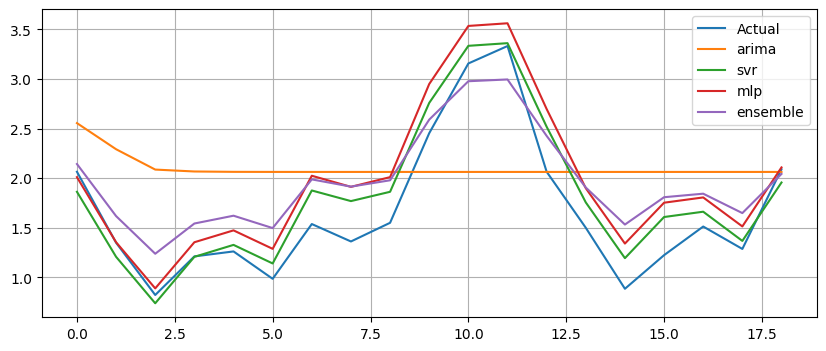

Generation 37: Fitness = 2.12523


ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8145210356912198
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7903676901658476
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7888808644460586
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8030488147357877
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1541216934277945
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.0869817046138732
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8157653173873435
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8058760414741412
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6248483005272807
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1509639883955172
SVRModel {'kernel': 'linear', 'c': 67.77825402054158, 'gamma': 'scale', 'epsilon': 0.3089314186490758} Fitness: 3.2774997965761368
SVRModel {'kernel': 'linear', 'c': 63.05282210110187, 'gamma': 'scale', 'epsilon': 0.3437532018656846} Fitness: 3.5883514510636796
SVRModel {'kernel': 'linear', 'c': 61.98690414224535, 'gamma': 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


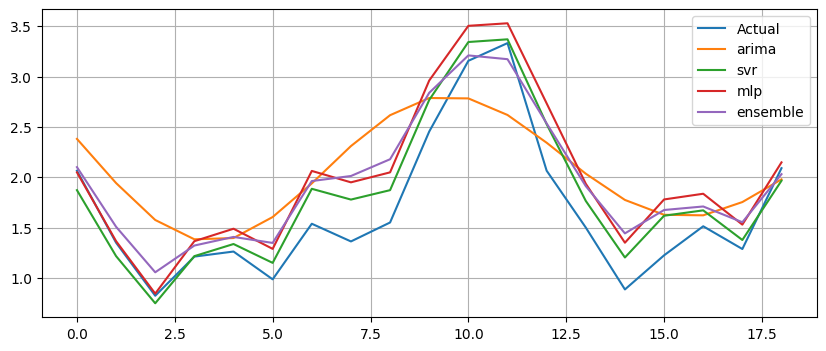

Generation 38: Fitness = 2.26357


ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8166786129566541
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8038913643889988
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8040112771094818
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1504903540330988
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8082444982268944
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1612412123374896
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8099813983263036
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1501566725445174
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8048458356825028
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1541529814155913
SVRModel {'kernel': 'rbf', 'c': 63.25709255722103, 'gamma': 'scale', 'epsilon': 0.35926095746306563} Fitness: 1.533667782500138
SVRModel {'kernel': 'linear', 'c': 67.77825402054158, 'gamma': 'scale', 'epsilon': 0.3089314186490758} Fitness: 3.2794233258663597
SVRModel {'kernel': 'linear', 'c': 62.28085941209102, 'gamma': 'sc

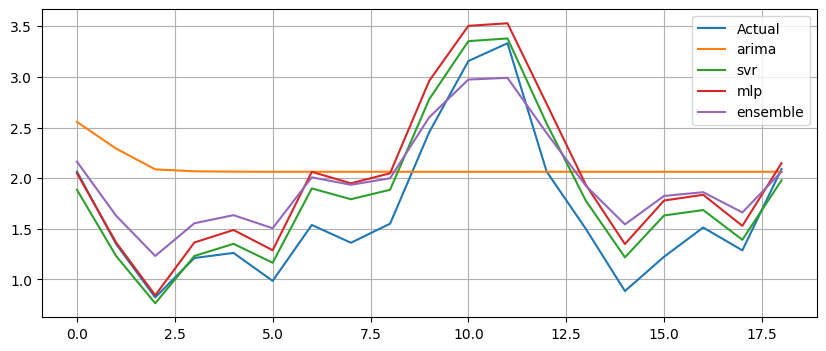

Generation 39: Fitness = 2.06280


ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8049099801617626
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.165917642734723
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8031214903119804
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8040112767313004
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.815977218145038
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8082430260587719
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8035659179952903
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8034093876014307
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.7907532837183295
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.156149939513106
SVRModel {'kernel': 'linear', 'c': 76.15570111525, 'gamma': 'scale', 'epsilon': 0.3089314186490758} Fitness: 3.2791571207908334
SVRModel {'kernel': 'linear', 'c': 67.77825402054158, 'gamma': 'scale', 'epsilon': 0.3089314186490758} Fitness: 3.241342304116657
SVRModel {'kernel': 'linear', 'c': 62.28085941209102, 'gamma': 'scale'

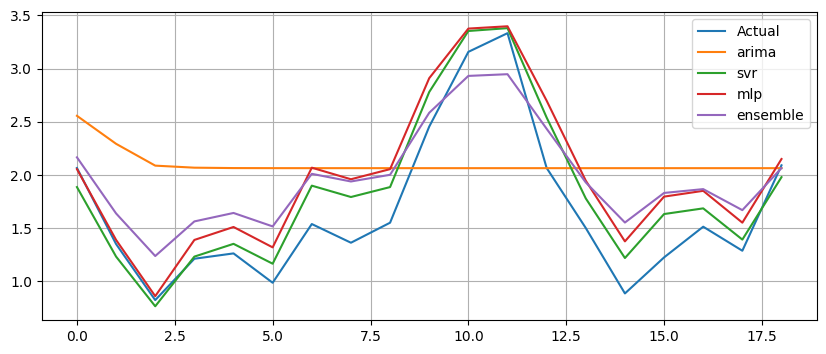

Generation 40: Fitness = 2.02653


ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8043432819553528
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8046958303844397
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8068366782427692
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8146335028013207
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8137367211155171
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8075285203529309
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8137737793874893
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8280807816486898
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1539374754245562
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1506796407901916
SVRModel {'kernel': 'linear', 'c': 67.77825402054158, 'gamma': 'scale', 'epsilon': 0.302656954398389} Fitness: 3.209445037456556
SVRModel {'kernel': 'linear', 'c': 62.28085941209102, 'gamma': 'scale', 'epsilon': 0.3066245940295862} Fitness: 3.260051182605685
SVRModel {'kernel': 'linear', 'c': 62.09058056661803, 'gamma': 'sc

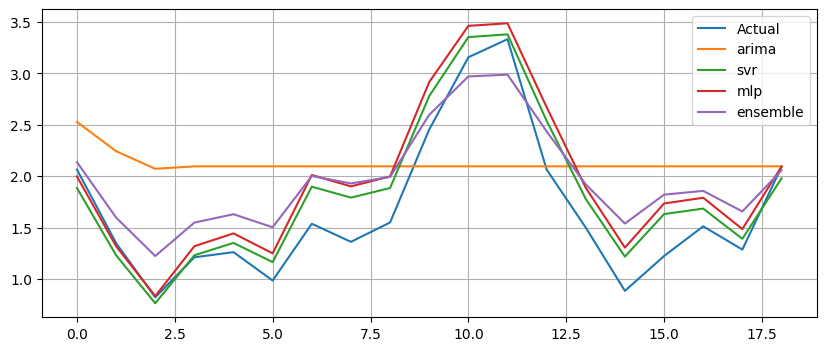

Generation 41: Fitness = 2.08681


ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.9269633065787806
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1502924183975316
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.160968439540676
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8043432819553528
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1592823852115282
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.8004100258819595
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8011570710274469
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8184234468362032
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8068858473074623
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1560937445807342
SVRModel {'kernel': 'linear', 'c': 67.08943238199484, 'gamma': 'scale', 'epsilon': 0.3066245940295862} Fitness: 3.3923305618272814
SVRModel {'kernel': 'linear', 'c': 62.96968105063776, 'gamma': 'scale', 'epsilon': 0.2989363712940503} Fitness: 3.1091062890747114
SVRModel {'kernel': 'linear', 'c': 67.77825402054158, 'gamma': '

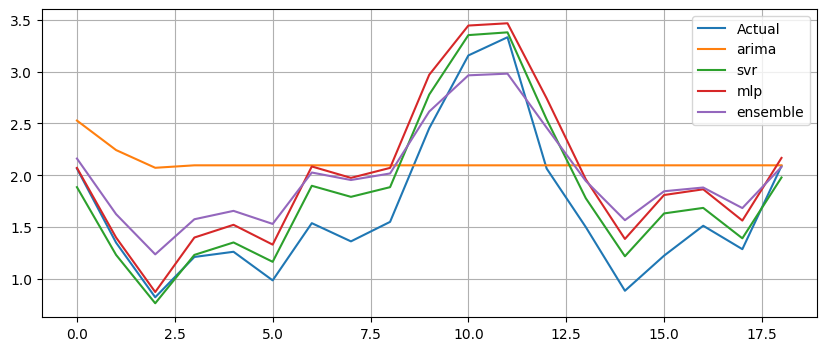

Generation 42: Fitness = 1.98480


ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8021893714003477
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.9178484502056643
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1472146366040699
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8011570710274469
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8068103707072768
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.8728910059871675
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1515926746310678
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.9326349038720317
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.8474525944397349
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.9565663645042708
SVRModel {'kernel': 'linear', 'c': 67.08943238199484, 'gamma': 'scale', 'epsilon': 0.3066245940295862} Fitness: 3.260581602156308
SVRModel {'kernel': 'linear', 'c': 67.08943238199484, 'gamma': 'scale', 'epsilon': 0.3066245940295862} Fitness: 3.391801041067987
SVRModel {'kernel': 'rbf', 'c': 67.77825402054158, 'gamma': 'scal

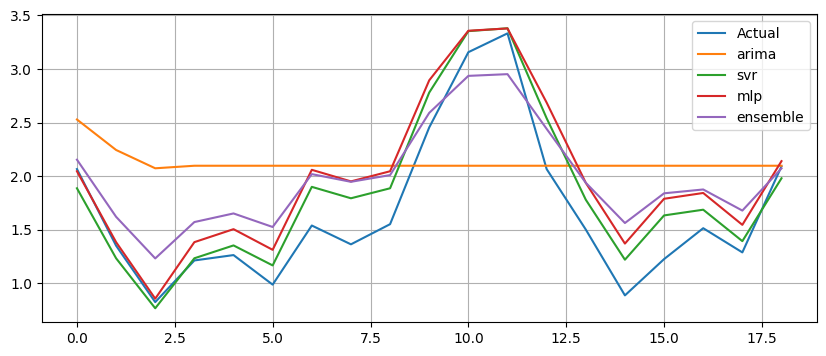

Generation 43: Fitness = 2.00418


ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8052200481173225
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 1.0042625965327718
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.0918571261564545
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.8050099109197479
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1505299006933272
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.801538063156198
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8162864000969908
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.15690716259755
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.835557320031387
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8019662127410498
SVRModel {'kernel': 'linear', 'c': 67.66602644608881, 'gamma': 'scale', 'epsilon': 0.3220614430707226} Fitness: 3.3903853627698304
SVRModel {'kernel': 'linear', 'c': 67.20165995644761, 'gamma': 'scale', 'epsilon': 0.3066245940295862} Fitness: 3.4027458450812356
SVRModel {'kernel': 'linear', 'c': 63.45368133305266, 'gamma': 'sca

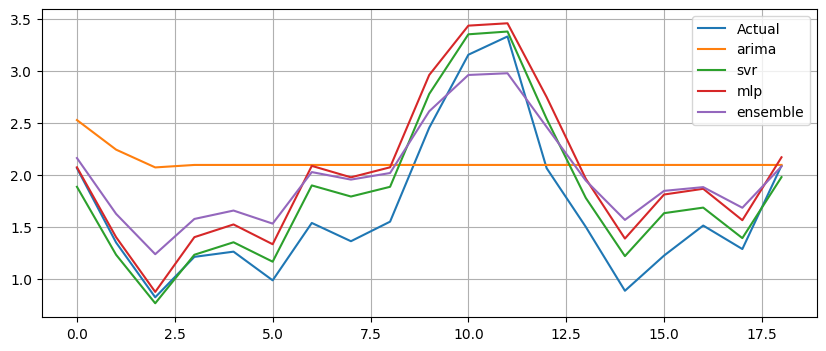

Generation 44: Fitness = 1.98088




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.110507006076362
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 1.013136995370283
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1545532196594674
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6937722906598998
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8189600619672177
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.9368550225410557
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8103410893801687
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1339805783320365
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8133258466570419
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8007056939822395
SVRModel {'kernel': 'linear', 'c': 67.08943238199484, 'gamma': 'scale', 'epsilon': 0.3066245940295862} Fitness: 3.253025093725594
SVRModel {'kernel': 'linear', 'c': 66.63882879158193, 'gamma': 'scale', 'epsilon': 0.3363785567677152} Fitness: 3.6533906685987976
SVRModel {'kernel': 'linear', 'c': 67.10391453590432, 'gamma': 'scale', 'epsilon': 0.3066245940295862

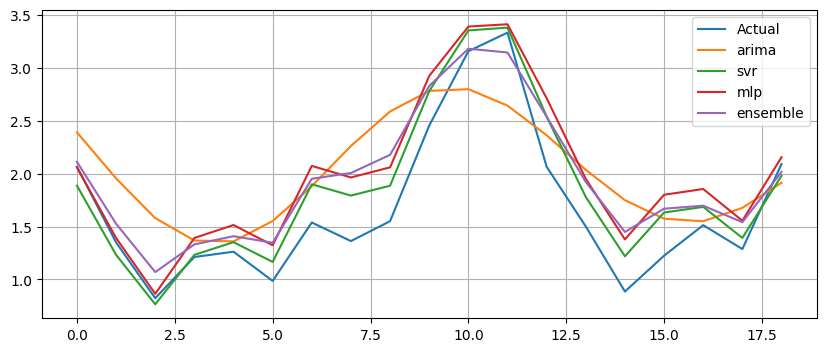

Generation 45: Fitness = 2.26053


ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8151137545116295
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8132699255379394
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 1.0192924187754242
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.9339517256812457
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.7970856901408969
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8176171706021365
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8168119960937762
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1563985068126983
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1423733525317001
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6995945883218169
SVRModel {'kernel': 'linear', 'c': 75.48842489879993, 'gamma': 'scale', 'epsilon': 0.3066245940295862} Fitness: 3.256330814290262
SVRModel {'kernel': 'linear', 'c': 66.72852099672703, 'gamma': 'scale', 'epsilon': 0.3363785567677152} Fitness: 3.5195926040476992
SVRModel {'kernel': 'linear', 'c': 67.19511573166012, 'gamma': '

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


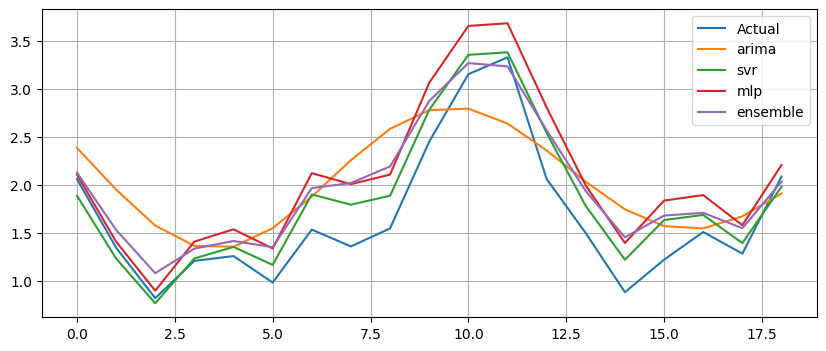

Generation 46: Fitness = 2.18161




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.150397552370072
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.690418658416435
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8032299000771408
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8031606022894737
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8006176640922786
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8138031229379138
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1625656791990864
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8167940640170595
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.800427243607561
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0751243387555665
SVRModel {'kernel': 'linear', 'c': 66.63882879158193, 'gamma': 'scale', 'epsilon': 0.3363785567677152} Fitness: 3.4746007702386223
SVRModel {'kernel': 'rbf', 'c': 66.63882879158193, 'gamma': 'scale', 'epsilon': 0.3075958023170262} Fitness: 1.4524906093839314
SVRModel {'kernel': 'linear', 'c': 66.9441422200927, 'gamma': 'scale', 'epsilon': 0.2979353821509928} Fi

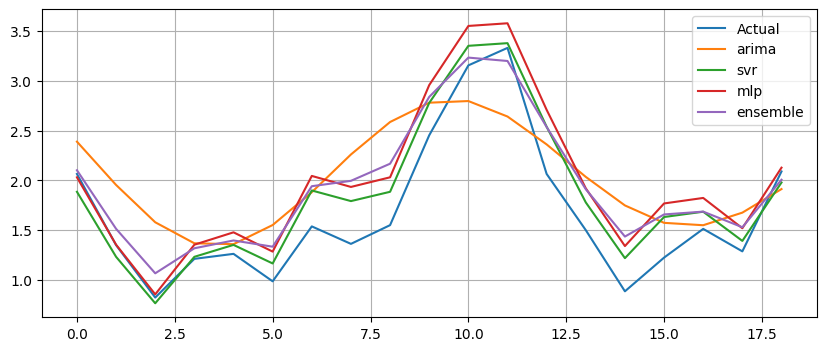

Generation 47: Fitness = 2.30855


ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.7998961521026264
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1545225035519355
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.151674722493199
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1557351689905322
ArimaModel {'p': 1, 'd': 0, 'q': 1} Fitness: 1.067523715930261
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.0757191299228064
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8001724219224091
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8123579956481339
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.169633676429
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8289520465302969
SVRModel {'kernel': 'rbf', 'c': 66.98134359481156, 'gamma': 'scale', 'epsilon': 0.3138580590025615} Fitness: 1.5156204013161547
SVRModel {'kernel': 'linear', 'c': 66.98907511042648, 'gamma': 'scale', 'epsilon': 0.3291819944820379} Fitness: 3.41307497917248
SVRModel {'kernel': 'linear', 'c': 66.9441422200927, 'gamma': 'scale', 'ep

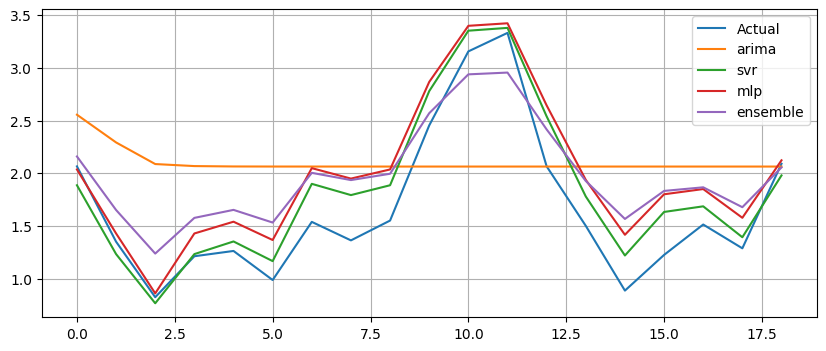

Generation 48: Fitness = 2.01833


ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8117731700446662
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.217143373108119
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.162080839497368
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8383231110522331
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1628218964302262
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9511887733623051
ArimaModel {'p': 0, 'd': 0, 'q': 1} Fitness: 0.9320172471943242
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.7975883172252677
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8124949335293664
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.0809116968639443
SVRModel {'kernel': 'linear', 'c': 67.03789824748753, 'gamma': 'scale', 'epsilon': 0.2543952017207046} Fitness: 2.720020523837804
SVRModel {'kernel': 'rbf', 'c': 66.9441422200927, 'gamma': 'scale', 'epsilon': 0.2648240301881715} Fitness: 1.3556899640157132
SVRModel {'kernel': 'linear', 'c': 67.03789824748753, 'gamma': 'scale'

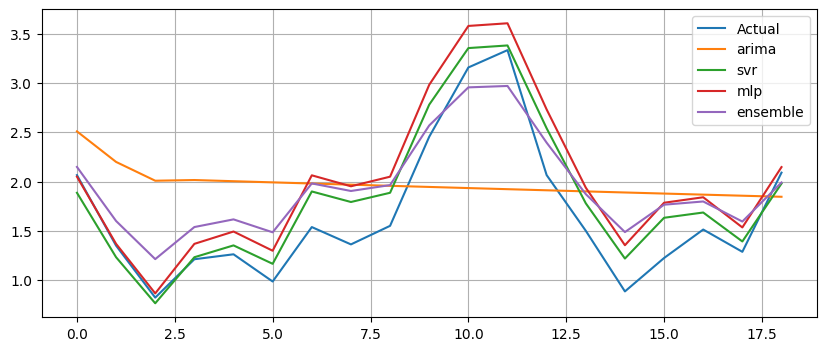

Generation 49: Fitness = 2.22702




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8134300320363442
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.83426326724433
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.067075737334188
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.2337271099141458
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1457860105335818
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8152648739131315
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8091762783602559
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1507398848235701
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.797636466387781
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9626713410915304
SVRModel {'kernel': 'rbf', 'c': 66.77876483131256, 'gamma': 'scale', 'epsilon': 0.2648240301881715} Fitness: 1.3898121911651096
SVRModel {'kernel': 'linear', 'c': 66.80420618036207, 'gamma': 'scale', 'epsilon': 0.3363785567677152} Fitness: 3.514152000733689
SVRModel {'kernel': 'rbf', 'c': 66.94220066701948, 'gamma': 'scale', 'epsilon': 0.32844753793243014} Fitne

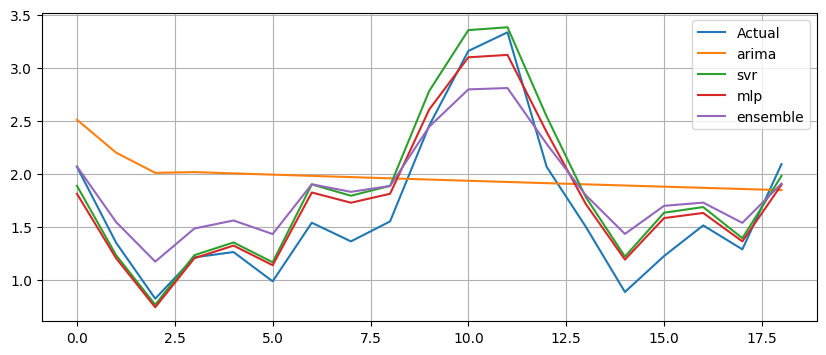

Generation 50: Fitness = 2.42845




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8448330429324028
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.846007544142638
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1472631802536972
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8016528242060159
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1462546284779414
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.0748122866908203
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8368595470338015
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1348796648311874
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6859314569985377
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1680021001391254
SVRModel {'kernel': 'linear', 'c': 66.63882879158193, 'gamma': 'scale', 'epsilon': 0.31869824950003295} Fitness: 3.35126457347547
SVRModel {'kernel': 'linear', 'c': 66.63882879158193, 'gamma': 'scale', 'epsilon': 0.32101710714483395} Fitness: 3.370521711936404
SVRModel {'kernel': 'linear', 'c': 60.18618688851288, 'gamma': 'scale', 'epsilon': 0.336378556767715

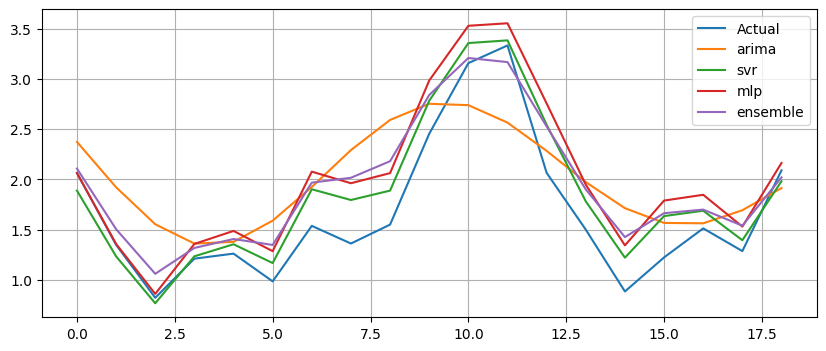

Generation 51: Fitness = 2.27920




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.083630377521881
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9561636787658941
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.823917642664738
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.164027369261592
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.146309905969489
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.929446427163716
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.0749994350964114
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7918990516982567
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1471680821517738
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8325173047969446
SVRModel {'kernel': 'linear', 'c': 66.89698538570335, 'gamma': 'scale', 'epsilon': 0.31869824950003295} Fitness: 3.325523504593417
SVRModel {'kernel': 'linear', 'c': 66.71999294395839, 'gamma': 'scale', 'epsilon': 0.3334631858628304} Fitness: 3.4609878871929705
SVRModel {'kernel': 'poly', 'c': 66.63882879158193, 'gamma': 'scale', 'epsilon': 0.32101710714483395} F

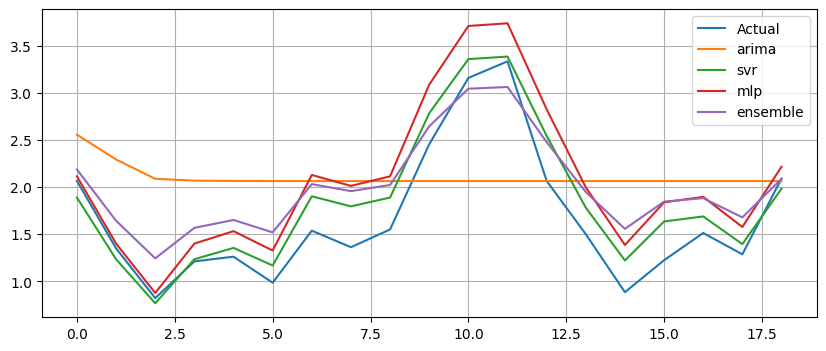

Generation 52: Fitness = 2.00963




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1512632203367987
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1663773856692359
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.9389467367511279
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.1031021299069648
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9318114780084381
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1486391546990395
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.0785203043370197
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9555295991518287
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1485405625896565
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9560143129124856
SVRModel {'kernel': 'linear', 'c': 66.89698538570335, 'gamma': 'scale', 'epsilon': 0.31869824950003295} Fitness: 3.3302567886388803
SVRModel {'kernel': 'linear', 'c': 66.89698538570335, 'gamma': 'scale', 'epsilon': 0.31869824950003295} Fitness: 3.3231160857614617
SVRModel {'kernel': 'linear', 'c': 66.63882879158193, 'gamma': 'scale', 'epsilon': 0.32101710714

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


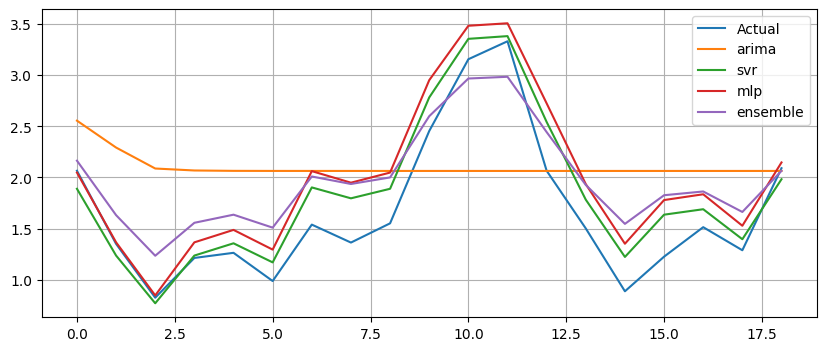

Generation 53: Fitness = 2.05697


ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.0863848452428573
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.1019465939326698
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1636982880053506
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.821586680479151
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.955799901669765
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9507184498789196
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.0825492616953083
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.9373678887769569
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1472242891210565
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9555271057251351
SVRModel {'kernel': 'linear', 'c': 66.71999294395839, 'gamma': 'scale', 'epsilon': 0.3334631858628304} Fitness: 3.452901839318471
SVRModel {'kernel': 'linear', 'c': 66.71999294395839, 'gamma': 'scale', 'epsilon': 0.3334631858628304} Fitness: 3.475980982022666
SVRModel {'kernel': 'linear', 'c': 66.97814953807982, 'gamma': 'sca

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


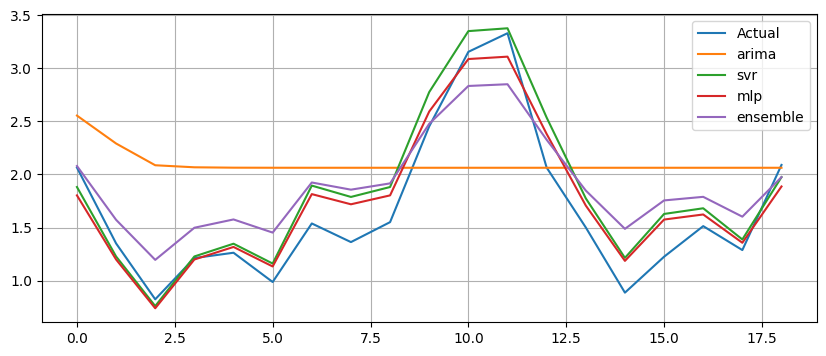

Generation 54: Fitness = 2.29528


ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.1043182852137694
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.082907415143246
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.087285855540471
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.094920266859579
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.8319267905914641
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1652274294814666
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.9401127486380169
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9512207495126141
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.9408976983563817
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.8635146154551749
SVRModel {'kernel': 'linear', 'c': 66.77741376623048, 'gamma': 'scale', 'epsilon': 0.3334631858628304} Fitness: 3.4741802328673916
SVRModel {'kernel': 'linear', 'c': 66.97814953807982, 'gamma': 'scale', 'epsilon': 0.34225852075735264} Fitness: 3.5316524369388596
SVRModel {'kernel': 'linear', 'c': 66.75645096626525, 'gamma': 's

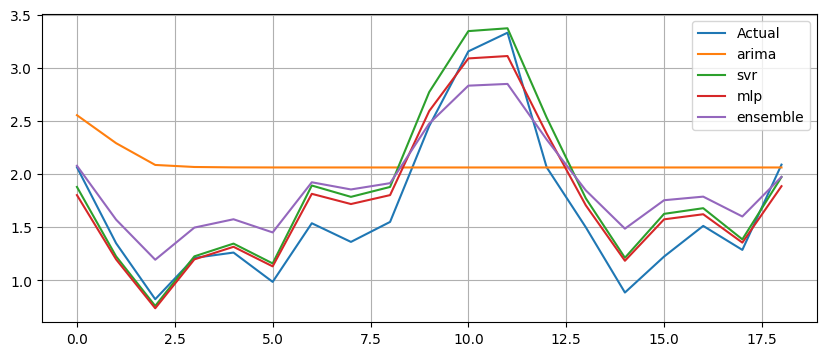

Generation 55: Fitness = 2.29638


ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.0834116192946328
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.1016975846969188
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.197224957641466
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9512196675811044
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1919385331836942
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9483775442701672
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1635018233175318
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0958499066909306
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8071539525788552
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1463149710529528
SVRModel {'kernel': 'linear', 'c': 66.90894790390058, 'gamma': 'scale', 'epsilon': 0.3334631858628304} Fitness: 3.466061230676861
SVRModel {'kernel': 'linear', 'c': 66.9416590108075, 'gamma': 'scale', 'epsilon': 0.3334631858628304} Fitness: 3.468915237468373
SVRModel {'kernel': 'linear', 'c': 66.76135907695068, 'gamma': 'sca

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


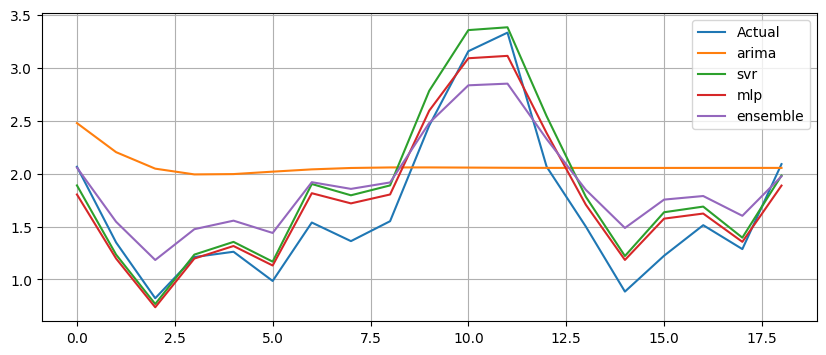

Generation 56: Fitness = 2.31809


ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0936309177190853
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0902287232544707
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 1.4551076710353987
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.940111627787521
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9528457984892079
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0907742827014366
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1932754601245252
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8181023268477107
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.0843936163593186
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.950248649985904
SVRModel {'kernel': 'linear', 'c': 66.88471976843334, 'gamma': 'scale', 'epsilon': 0.3334631858628304} Fitness: 3.458913864909592
SVRModel {'kernel': 'linear', 'c': 66.88471976843334, 'gamma': 'scale', 'epsilon': 0.3499195687037055} Fitness: 3.4221016807258113
SVRModel {'kernel': 'poly', 'c': 66.77741376623048, 'gamma': 'scal

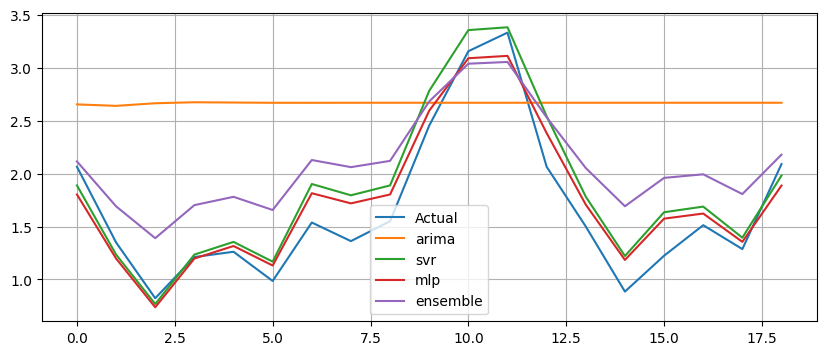

Generation 57: Fitness = 1.73203


ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0960963601685385
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.835263024678975
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9483192611026026
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.8351940898504138
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8339214802935903
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.9393290748835923
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 1.5497408476900523
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0935809644301802
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.8510829348382971
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5727132806217026
SVRModel {'kernel': 'linear', 'c': 66.88368394348305, 'gamma': 'scale', 'epsilon': 0.3334631858628304} Fitness: 3.467619196908059
SVRModel {'kernel': 'linear', 'c': 66.88193952442536, 'gamma': 'scale', 'epsilon': 0.36924648832642903} Fitness: 3.240973260223079
SVRModel {'kernel': 'linear', 'c': 66.78122983518875, 'gamma': 's

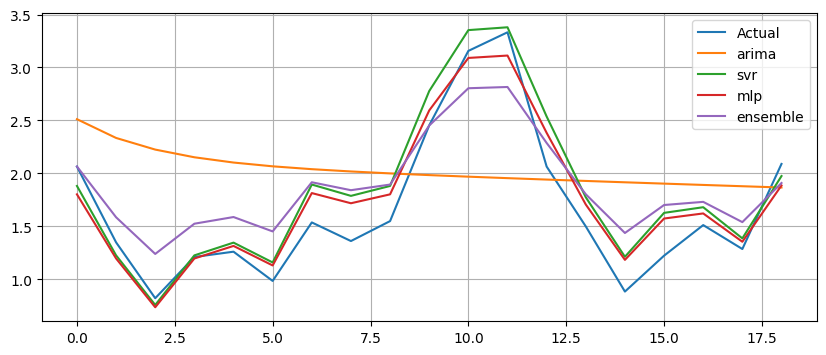

Generation 58: Fitness = 2.35135


ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5709697334190453
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 1.5466579528807545
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0989641630630702
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0979638297465728
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8163770886740089
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.8388552454932188
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.956932702862241
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9403614650432445
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0995782070614948
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9478788128930062
SVRModel {'kernel': 'poly', 'c': 66.77741376623048, 'gamma': 'scale', 'epsilon': 0.3304157959204035} Fitness: 1.3668071133764246
SVRModel {'kernel': 'poly', 'c': 66.88471976843334, 'gamma': 'scale', 'epsilon': 0.34200386036313046} Fitness: 1.3940960047878335
SVRModel {'kernel': 'linear', 'c': 66.78122983518875, 'gamma': 'sca

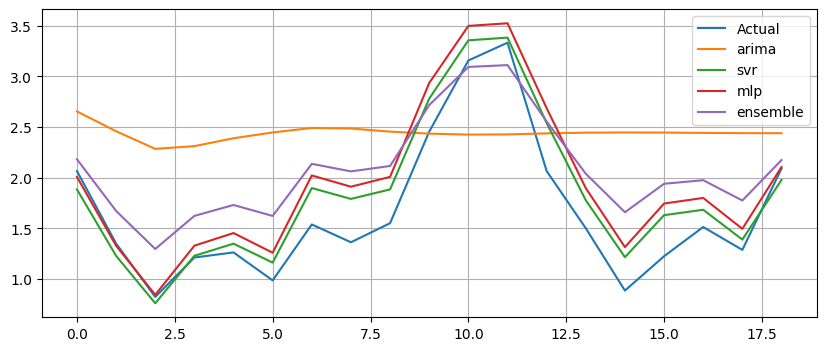

Generation 59: Fitness = 1.74614




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1326643493706354
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8099152782077258
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.572804596560914
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.7723713497346902
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5655458972237848
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 1.5531433217961386
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.8395053553084006
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0900540071488547
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.238262485204513
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8214679005072806
SVRModel {'kernel': 'linear', 'c': 65.5087294275726, 'gamma': 'scale', 'epsilon': 0.3482525266089666} Fitness: 3.4599182414602896
SVRModel {'kernel': 'rbf', 'c': 64.91780364585324, 'gamma': 'scale', 'epsilon': 0.33405790826000753} Fitness: 1.5258676328117797
SVRModel {'kernel': 'poly', 'c': 66.78036300650277, 'gamma': 'scale', 'epsilon': 0.3325792494636226} Fi

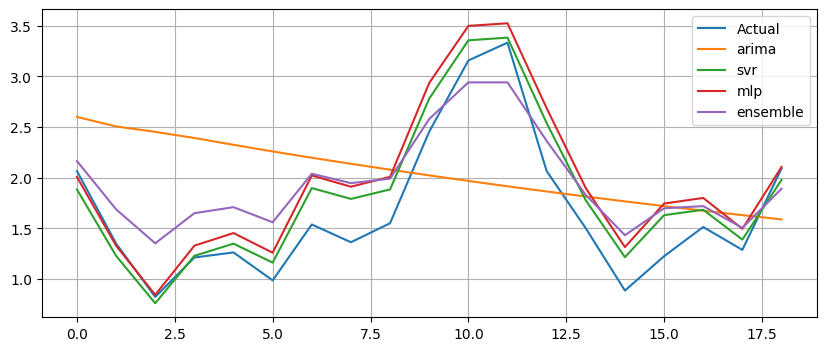

Generation 60: Fitness = 2.12390


ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 1.3850623252158374
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5721504359293488
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.099761485412258
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.7318992812499727
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.943628324065168
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.8462653262024387
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8729059264436669
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 1.4413091498981667
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0963767544420806
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9499004303789271
SVRModel {'kernel': 'poly', 'c': 66.77859605039268, 'gamma': 'scale', 'epsilon': 0.3325792494636226} Fitness: 1.3668705232900118
SVRModel {'kernel': 'poly', 'c': 66.78004755102657, 'gamma': 'scale', 'epsilon': 0.33616805071775946} Fitness: 1.4081633229653752
SVRModel {'kernel': 'linear', 'c': 66.44191152121095, 'gamma': 'scal

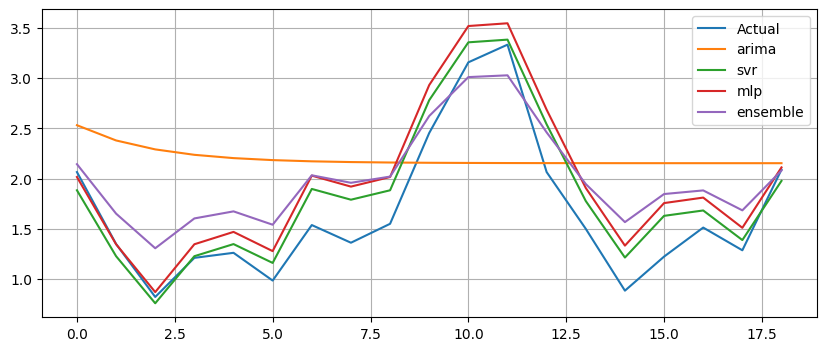

Generation 61: Fitness = 1.97041


ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.9003108992205724
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9907104533052263
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9553510377387111
ArimaModel {'p': 1, 'd': 0, 'q': 1} Fitness: 1.815466186089463
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.0882077655304845
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.7359083643643927
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.943305314808063
ArimaModel {'p': 1, 'd': 0, 'q': 0} Fitness: 1.6296530155249744
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 1.438146442252783
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8767176436305052
SVRModel {'kernel': 'linear', 'c': 66.57810071768449, 'gamma': 'scale', 'epsilon': 0.347425005964396} Fitness: 3.521079641548251
SVRModel {'kernel': 'linear', 'c': 66.7482463833906, 'gamma': 'scale', 'epsilon': 0.3486728362330769} Fitness: 3.4684237977598458
SVRModel {'kernel': 'linear', 'c': 62.15631204370034, 'gamma': 'scale

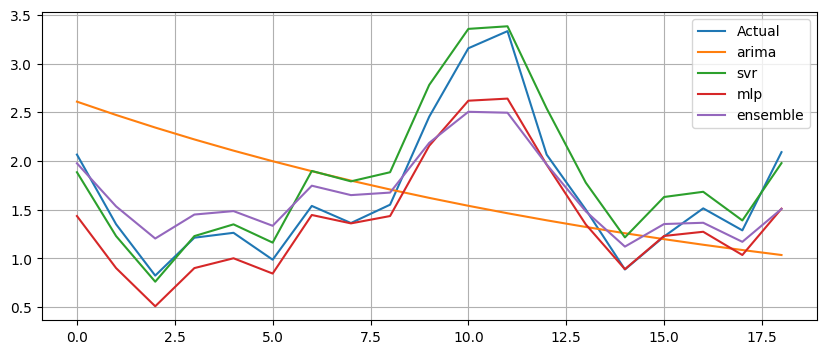

Generation 62: Fitness = 2.47783


ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5712072812566076
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8480163947758389
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.8211286883119269
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9553578577345654
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.0837778810293985
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 1.4016948644302403
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 1.4384044205742001
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9553448512760214
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.0892523841524264
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9555601791759255
SVRModel {'kernel': 'poly', 'c': 66.80628334860594, 'gamma': 'scale', 'epsilon': 0.33616805071775946} Fitness: 1.41001268546963
SVRModel {'kernel': 'linear', 'c': 66.78780296970803, 'gamma': 'scale', 'epsilon': 0.3354916454558356} Fitness: 3.49899578762257
SVRModel {'kernel': 'poly', 'c': 66.86840333194631, 'gamma': 'scale'

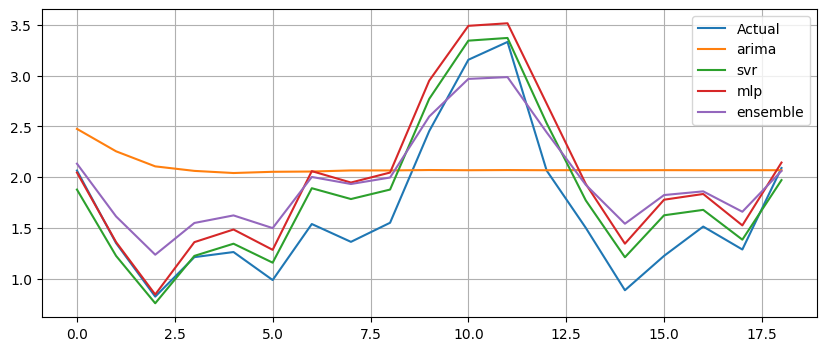

Generation 63: Fitness = 2.07850




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.945653752593269
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5711779201697633
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5710300307277343
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9551627149962485
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.8178357044482151
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6371890104645341
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5794267053298499
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5710259264623403
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8222417135664544
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.0850452394062815
SVRModel {'kernel': 'linear', 'c': 66.83621191314253, 'gamma': 'scale', 'epsilon': 0.34239497354938575} Fitness: 3.541257893278434
SVRModel {'kernel': 'poly', 'c': 66.80628334860594, 'gamma': 'scale', 'epsilon': 0.33616805071775946} Fitness: 1.4090709437123805
SVRModel {'kernel': 'poly', 'c': 66.80628334860594, 'gamma': 'scale', 'epsilon': 0.34048580542635254

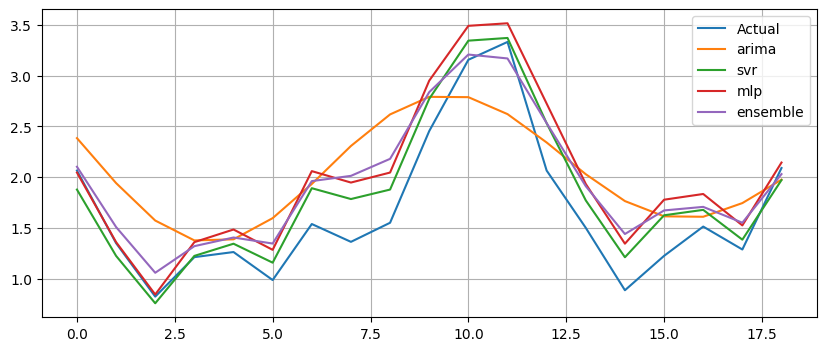

Generation 64: Fitness = 2.26723




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.940781994138206
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.8185846513103088
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0931522615590135
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9488049990295239
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.7952285415994798
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.795503023729204
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9564181855117848
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.2017103507778
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.955589631147407
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 1.4067326702206497
SVRModel {'kernel': 'linear', 'c': 67.78940698023236, 'gamma': 'scale', 'epsilon': 0.34454612155976216} Fitness: 3.5622034339565647
SVRModel {'kernel': 'poly', 'c': 66.80628334860594, 'gamma': 'scale', 'epsilon': 0.33616805071775946} Fitness: 1.4716832841636107
SVRModel {'kernel': 'linear', 'c': 66.83621191314253, 'gamma': 'scale', 'epsilon': 0.34239497354938575} 

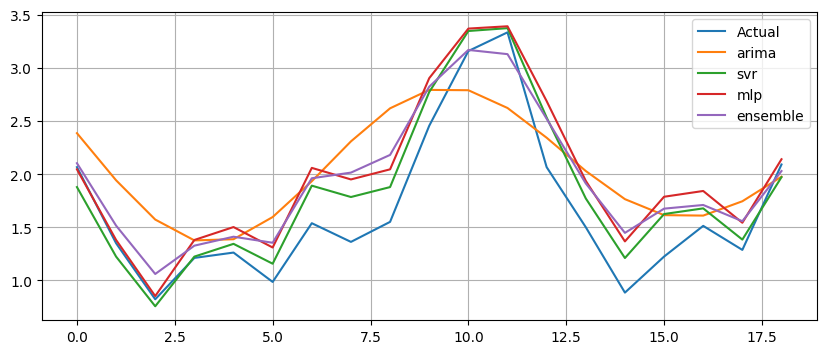

Generation 65: Fitness = 2.25681




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5687125207294033
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8211295814823047
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8068751098759895
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6357678421775428
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.796774412569337
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.945804331516524
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1733262660467507
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 1.42987316944709
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.8192140135179518
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.8893415804145546
SVRModel {'kernel': 'poly', 'c': 67.12631866607668, 'gamma': 'scale', 'epsilon': 0.33803061096771236} Fitness: 1.4235823740811595
SVRModel {'kernel': 'linear', 'c': 66.63789705355445, 'gamma': 'scale', 'epsilon': 0.33645276438078914} Fitness: 3.5127481273379404
SVRModel {'kernel': 'linear', 'c': 70.49831736017957, 'gamma': 'scale', 'epsilon': 0.3328106207480507}

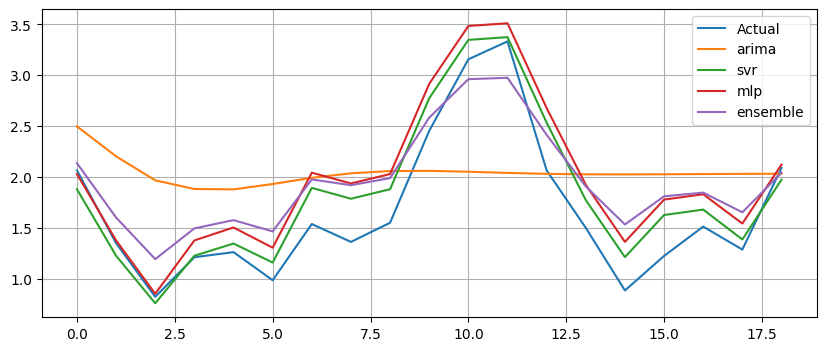

Generation 66: Fitness = 2.15512




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.2035673546672812
ArimaModel {'p': 1, 'd': 0, 'q': 0} Fitness: 1.6264240996123873
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7438979917327861
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.8211852675008657
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.196963784290605
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.8220077644741854
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 1.4160213736750302
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1466547475154687
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.045168346367485
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.8385705449113148
SVRModel {'kernel': 'linear', 'c': 70.49831736017957, 'gamma': 'scale', 'epsilon': 0.3328106207480507} Fitness: 3.4498851941847337
SVRModel {'kernel': 'poly', 'c': 66.86955750977417, 'gamma': 'scale', 'epsilon': 0.33607229009820205} Fitness: 1.4414628102097173
SVRModel {'kernel': 'poly', 'c': 67.12631866607668, 'gamma': 'scale', 'epsilon': 0.3366726458713264} 

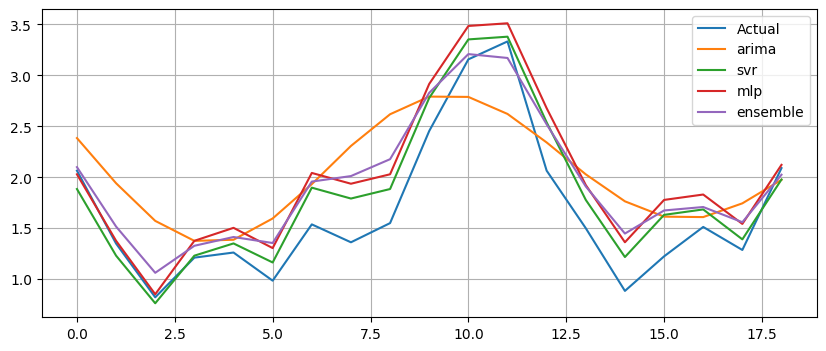

Generation 67: Fitness = 2.26352




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7877712446999665
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 1.416643136599195
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.1999729307210902
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7907704575941783
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 1.3993199461743475
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.8395973735268707
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.8242704107969079
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.0940196578123782
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.1979441492896488
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7349968758960896
SVRModel {'kernel': 'poly', 'c': 69.25156240745301, 'gamma': 'scale', 'epsilon': 0.3369746919731125} Fitness: 1.412017168635186
SVRModel {'kernel': 'poly', 'c': 70.14463192906935, 'gamma': 'scale', 'epsilon': 0.33546985186789824} Fitness: 1.397226658913941
SVRModel {'kernel': 'poly', 'c': 73.93807493765053, 'gamma': 'scale', 'epsilon': 0.34072076837657356} Fi

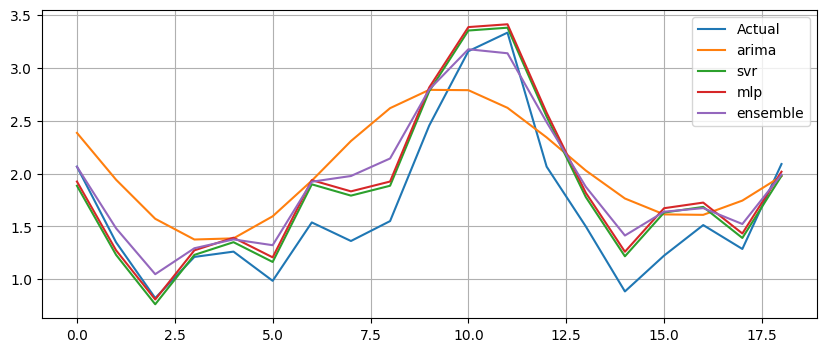

Generation 68: Fitness = 2.43721




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7918203796631214
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7901924990435647
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 1.4389356209897959
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.1985483302712936
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.7751611336847772
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7377290463235382
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1514735321465148
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.793421318596657
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.199605479089328
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 1.5549471055593203
SVRModel {'kernel': 'poly', 'c': 69.25156240745301, 'gamma': 'scale', 'epsilon': 0.3369746919731125} Fitness: 1.3914596154222127
SVRModel {'kernel': 'poly', 'c': 69.12964847066756, 'gamma': 'scale', 'epsilon': 0.3377499318755028} Fitness: 1.4253292302512077
SVRModel {'kernel': 'poly', 'c': 69.25156240745301, 'gamma': 'scale', 'epsilon': 0.3403942269066151} Fit

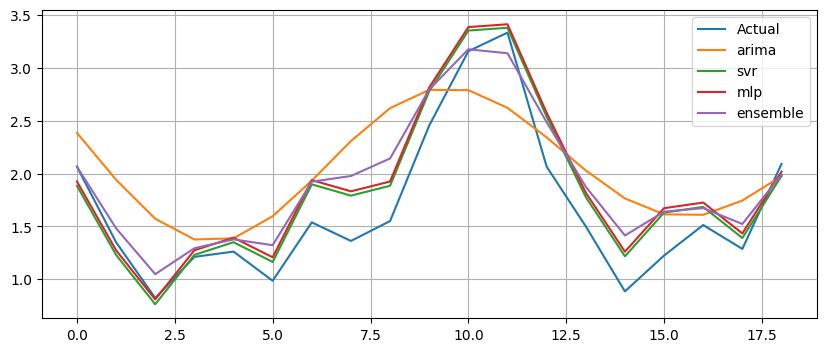

Generation 69: Fitness = 2.43810




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.1955512546888305
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 1.438790060978854
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 1.5547554421440202
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6420046488705757
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.2048265233262976
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7388704730929154
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1397779439552473
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.2473799556032423
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.8503904593653386
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7932660195786547
SVRModel {'kernel': 'poly', 'c': 66.86955750977417, 'gamma': 'scale', 'epsilon': 0.300788943809129} Fitness: 1.3309811838567005
SVRModel {'kernel': 'poly', 'c': 69.25156240745301, 'gamma': 'scale', 'epsilon': 0.3321649781739119} Fitness: 1.4148892305026541
SVRModel {'kernel': 'poly', 'c': 67.14238482697945, 'gamma': 'scale', 'epsilon': 0.33763273830004426} Fi

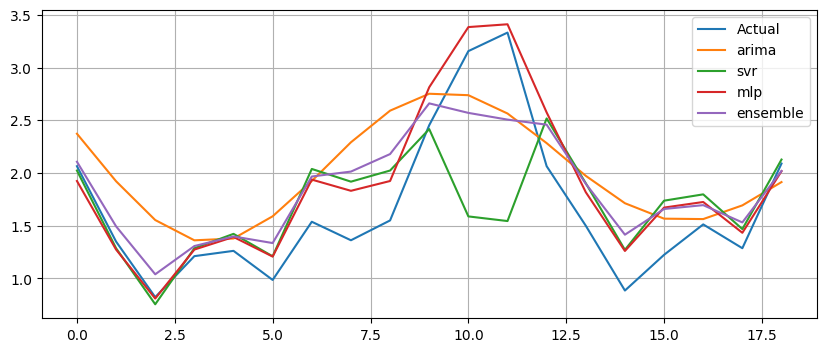

Generation 70: Fitness = 2.01076




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7954258976948787
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.8425636916590757
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.2035324976937574
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7946942939780164
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 1.4303300297033996
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7401887613408729
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.794540578607689
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7932696821986291
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7924068897645924
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7383190907711707
SVRModel {'kernel': 'poly', 'c': 66.86955750977417, 'gamma': 'scale', 'epsilon': 0.337430255194588} Fitness: 1.395179982445154
SVRModel {'kernel': 'poly', 'c': 67.024284942367, 'gamma': 'scale', 'epsilon': 0.337430255194588} Fitness: 1.4308663957063081
SVRModel {'kernel': 'poly', 'c': 67.0964057977052, 'gamma': 'scale', 'epsilon': 0.33795173904321457} Fitness

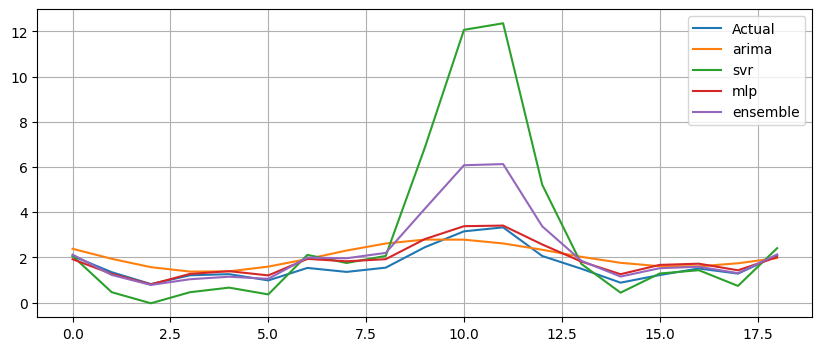

Generation 71: Fitness = 2.15669




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7428425716285108
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7987281966844604
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.1991622168221303
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7466216053466987
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822616127040222
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.151187102214539
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7407571606874672
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.8929007698937035
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7924505508021864
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.8444019027102243
SVRModel {'kernel': 'poly', 'c': 66.86955750977417, 'gamma': 'scale', 'epsilon': 0.3375416425700594} Fitness: 1.3965894802132028
SVRModel {'kernel': 'poly', 'c': 67.0964057977052, 'gamma': 'scale', 'epsilon': 0.3378403516677432} Fitness: 1.3683651669571495
SVRModel {'kernel': 'poly', 'c': 69.25156240745301, 'gamma': 'scale', 'epsilon': 0.3393396248444716} Fit

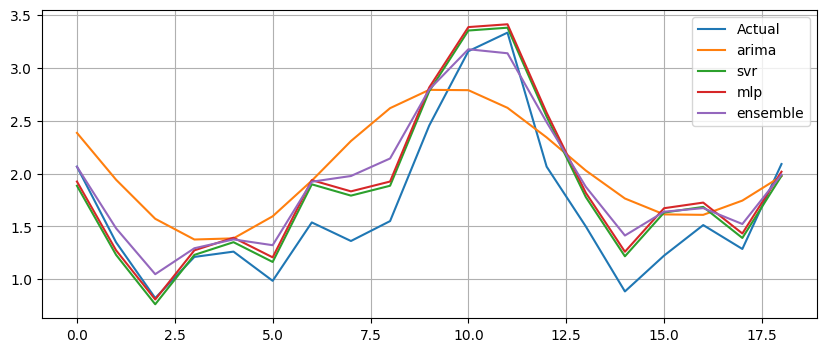

Generation 72: Fitness = 2.43721




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7407653229488802
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.9016465791167958
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.730955378503264
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.798830921280313
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.740194874990981
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7854043762205878
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.7415813746543365
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.685943277010684
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.209350168852896
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.202141571573855
SVRModel {'kernel': 'poly', 'c': 66.86955750977417, 'gamma': 'scale', 'epsilon': 0.3375416425700594} Fitness: 1.3953487831877733
SVRModel {'kernel': 'poly', 'c': 69.25156240745301, 'gamma': 'scale', 'epsilon': 0.33958956391113126} Fitness: 1.378214530537884
SVRModel {'kernel': 'poly', 'c': 67.2880032085082, 'gamma': 'scale', 'epsilon': 0.3380097685705106} Fitness:

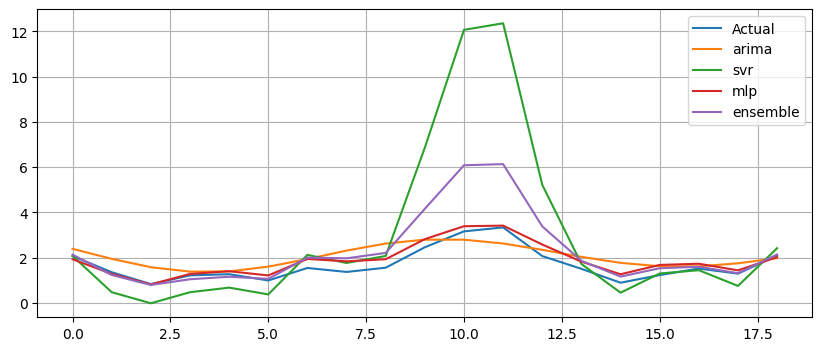

Generation 73: Fitness = 2.15691




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7954671088404726
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.739202561565703
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.785124027941425
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7934747227207017
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.8903419319983374
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.199526651065142
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7936926898675272
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 1.4177615027552317
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7918662499471236
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.7346841462767302
SVRModel {'kernel': 'poly', 'c': 66.86955750977417, 'gamma': 'scale', 'epsilon': 0.337430255194588} Fitness: 1.3931751021022925
SVRModel {'kernel': 'poly', 'c': 63.999408851622015, 'gamma': 'scale', 'epsilon': 0.33572776275750227} Fitness: 1.4166705503817325
SVRModel {'kernel': 'poly', 'c': 69.25156240745301, 'gamma': 'scale', 'epsilon': 0.33783139357578224} Fi

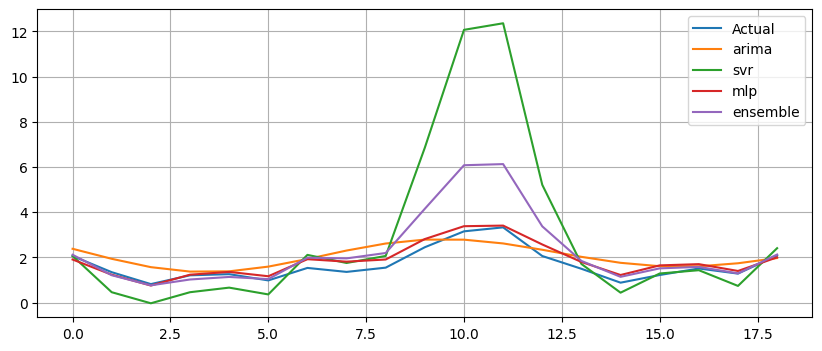

Generation 74: Fitness = 2.15661




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7915179574775522
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.7875181091467038
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 1.4317498789350718
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.2487513721729204
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.8107622893141055
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7943427936675427
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1869929565909536
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.7304391752221013
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7957414786832815
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7956293745651686
SVRModel {'kernel': 'poly', 'c': 67.17594576220534, 'gamma': 'scale', 'epsilon': 0.3397330952401326} Fitness: 1.3941641244258571
SVRModel {'kernel': 'poly', 'c': 66.98161495607702, 'gamma': 'scale', 'epsilon': 0.33789655702799254} Fitness: 1.4850551336232531
SVRModel {'kernel': 'poly', 'c': 67.14238482697945, 'gamma': 'scale', 'epsilon': 0.33870821841081095}

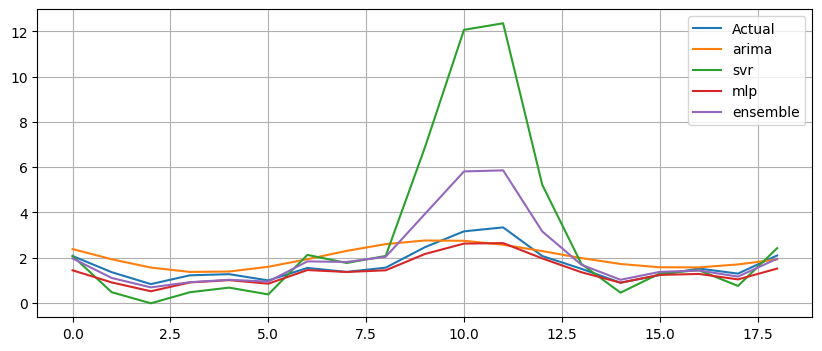

Generation 75: Fitness = 2.40506




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.796021272326483
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.195509604686777
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7959904265631033
ArimaModel {'p': 0, 'd': 1, 'q': 3} Fitness: 0.8337415680130398
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7903758622533195
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 1.5461640303912314
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1428695711384314
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.794891676275944
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.2610086937628036
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.790821967833585
SVRModel {'kernel': 'poly', 'c': 65.43895716229056, 'gamma': 'scale', 'epsilon': 0.33600193910678194} Fitness: 1.3804750849505354
SVRModel {'kernel': 'poly', 'c': 68.33733127355762, 'gamma': 'scale', 'epsilon': 0.33773559222123095} Fitness: 1.286266104461291
SVRModel {'kernel': 'poly', 'c': 67.14238482697945, 'gamma': 'scale', 'epsilon': 0.338276269734622} Fitne

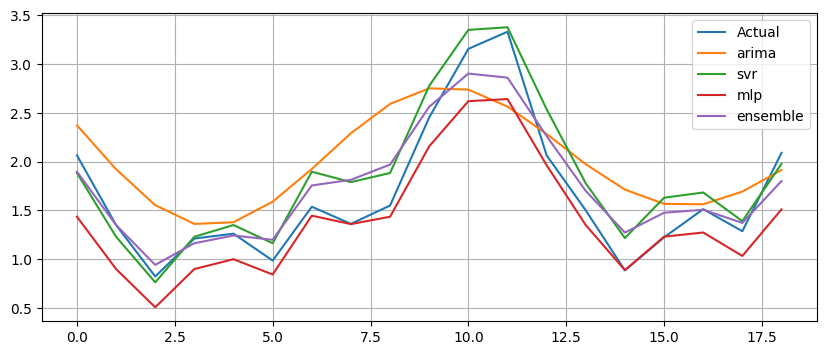

Generation 76: Fitness = 3.24355




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.795267940676859
ArimaModel {'p': 0, 'd': 0, 'q': 4} Fitness: 0.929885037061474
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1878936429013436
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1904203921870504
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6317581119906919
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1539514385565741
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.75561684674827
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.14313013140303
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1393708843197272
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1864567019442647
SVRModel {'kernel': 'poly', 'c': 67.2880032085082, 'gamma': 'scale', 'epsilon': 0.3380097685705106} Fitness: 1.3818325093911923
SVRModel {'kernel': 'linear', 'c': 67.14238482697945, 'gamma': 'scale', 'epsilon': 0.3382292583300268} Fitness: 3.643808061745782
SVRModel {'kernel': 'poly', 'c': 67.14238482697945, 'gamma': 'scale', 'epsilon': 0.338276269734622} Fitness:

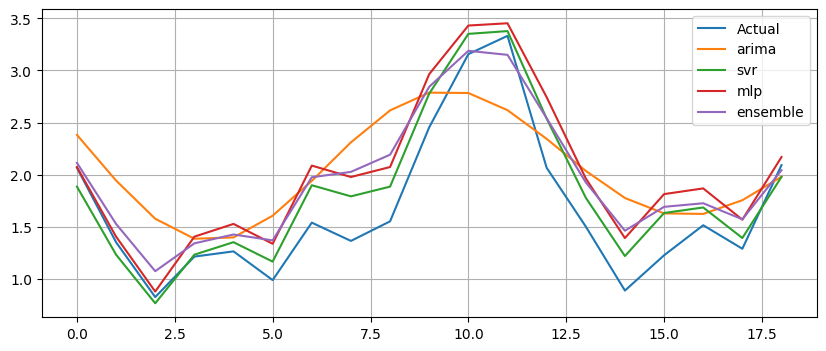

Generation 77: Fitness = 2.19329




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7880009348731218
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 2.1980180831079683
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6317581119906919
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6380355084739597
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7900276621069862
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7955984956481366
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.18861488664912
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7499677634208874
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7892684096841394
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.8201281271907879
SVRModel {'kernel': 'poly', 'c': 67.2880032085082, 'gamma': 'scale', 'epsilon': 0.3380097685705106} Fitness: 1.408324717003167
SVRModel {'kernel': 'poly', 'c': 67.14238482697945, 'gamma': 'scale', 'epsilon': 0.338276269734622} Fitness: 1.320325063472707
SVRModel {'kernel': 'rbf', 'c': 66.39191011594644, 'gamma': 'scale', 'epsilon': 0.33784348678842585} Fitness

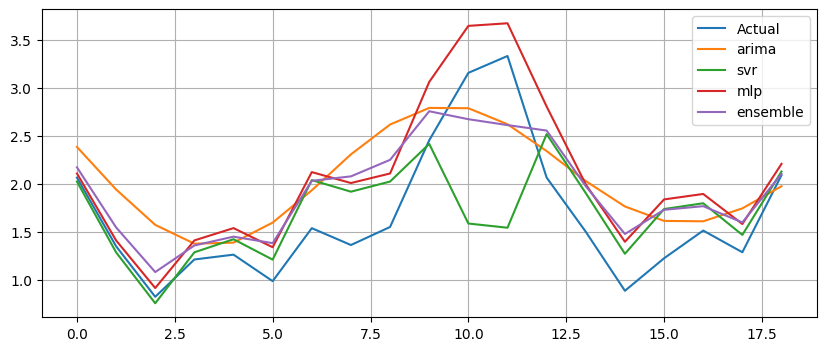

Generation 78: Fitness = 1.88958




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0702782089527
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1883945053311065
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.188301304939108
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6317581119906919
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6303895033214606
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7959260815583071
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.787721883570596
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7955639753582413
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.819153108462371
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1936489139114155
SVRModel {'kernel': 'rbf', 'c': 67.0371483253367, 'gamma': 'scale', 'epsilon': 0.33676457191483533} Fitness: 1.4929093021856688
SVRModel {'kernel': 'poly', 'c': 70.88626917172377, 'gamma': 'scale', 'epsilon': 0.33532971825474606} Fitness: 1.3206086760589377
SVRModel {'kernel': 'poly', 'c': 71.53150738111401, 'gamma': 'scale', 'epsilon': 0.33425080338115554} Fitnes

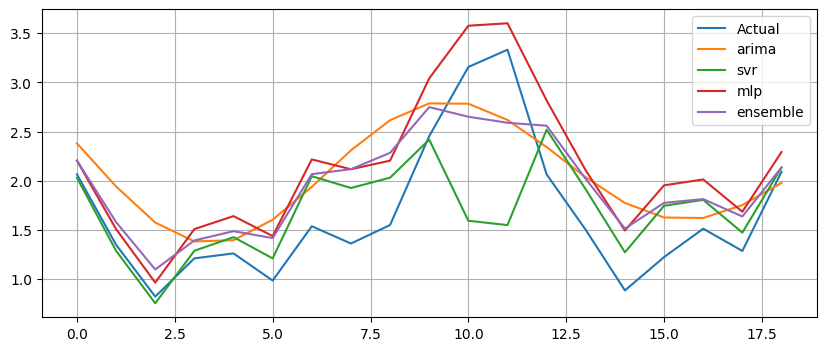

Generation 79: Fitness = 1.77791




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6309995826946266
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.82304968360172
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1393703904292902
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.746136153322559
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5640876034299032
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.190306633936068
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.7876562919614076
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1901679828049674
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1859739040500648
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.786968267089379
SVRModel {'kernel': 'rbf', 'c': 67.08518901109721, 'gamma': 'scale', 'epsilon': 0.33784348678842585} Fitness: 1.481851582902917
SVRModel {'kernel': 'poly', 'c': 66.23300756838894, 'gamma': 'scale', 'epsilon': 0.338276269734622} Fitness: 1.407973690048934
SVRModel {'kernel': 'rbf', 'c': 66.5760450053174, 'gamma': 'scale', 'epsilon': 0.33784348678842585} Fitness: 1

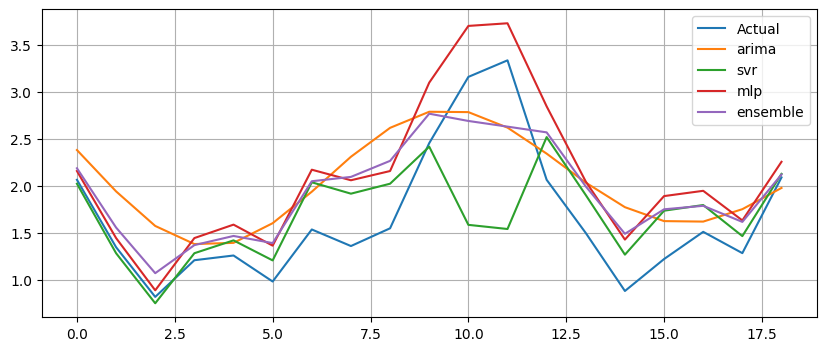

Generation 80: Fitness = 1.85393




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.7319424505475716
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.190011749174113
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.7691159020893519
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.7661404893079804
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.188558348665056
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.8016076199543904
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1906363089514427
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0741314504476833
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5641268835508357
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.188769605008824
SVRModel {'kernel': 'poly', 'c': 70.29300183871996, 'gamma': 'scale', 'epsilon': 0.338276269734622} Fitness: 1.4162821164020436
SVRModel {'kernel': 'poly', 'c': 70.29300183871996, 'gamma': 'scale', 'epsilon': 0.338276269734622} Fitness: 1.3085901529677428
SVRModel {'kernel': 'poly', 'c': 69.8175501245555, 'gamma': 'scale', 'epsilon': 0.3270851937458265} Fitness

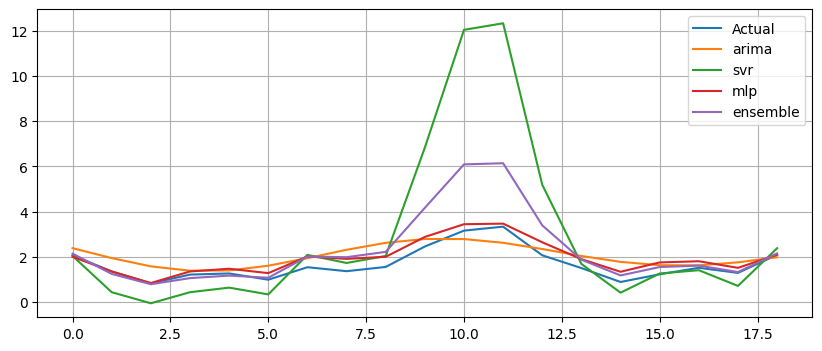

Generation 81: Fitness = 2.13900




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1878098966341604
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0697649766490942
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 0.9531593673241255
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1898171381456843
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7456456289123645
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.7627413778984564
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1878631596665405
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.7650913102154897
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.189173062670177
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.7311720029108075
SVRModel {'kernel': 'poly', 'c': 70.29300183871996, 'gamma': 'scale', 'epsilon': 0.338276269734622} Fitness: 1.3331676700121502
SVRModel {'kernel': 'rbf', 'c': 65.06944047390435, 'gamma': 'scale', 'epsilon': 0.3259621978750403} Fitness: 1.4620377524485215
SVRModel {'kernel': 'linear', 'c': 67.73565215998329, 'gamma': 'scale', 'epsilon': 0.33518100608697415} F

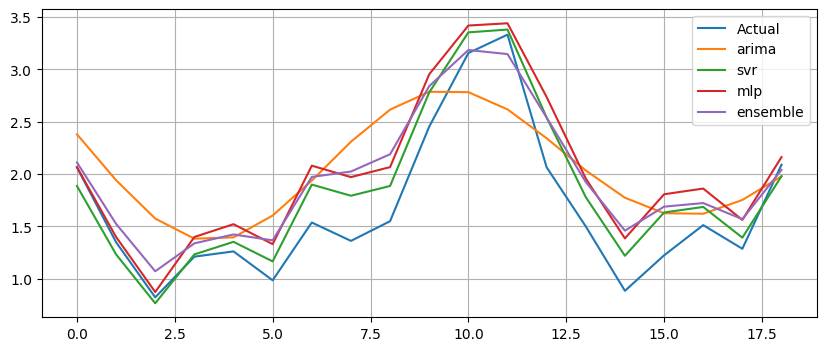

Generation 82: Fitness = 2.19542




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7457593059311984
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7456456289123645
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.7615491812850772
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.7304795497744645
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0939977115324977
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.746190817446797
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7455380562819203
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.18986738980282
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.18726406609016
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.7647391456463561
SVRModel {'kernel': 'poly', 'c': 66.90105412172626, 'gamma': 'scale', 'epsilon': 0.33784348678842585} Fitness: 1.4466210342391208
SVRModel {'kernel': 'poly', 'c': 70.29300183871996, 'gamma': 'scale', 'epsilon': 0.338276269734622} Fitness: 1.4468643551104097
SVRModel {'kernel': 'poly', 'c': 66.5760450053174, 'gamma': 'scale', 'epsilon': 0.3350821690249861} Fitness

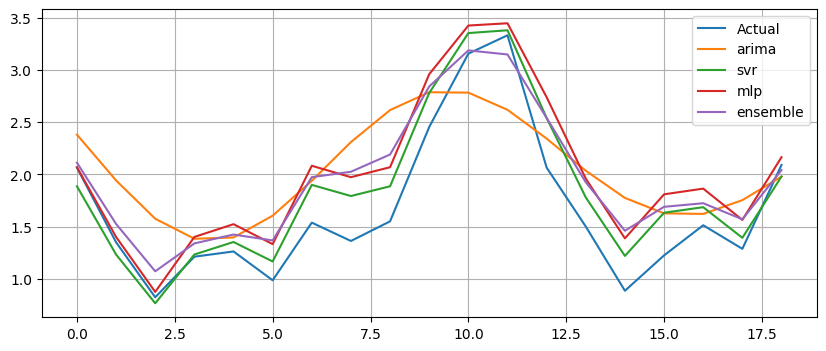

Generation 83: Fitness = 2.19431




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7494571365454923
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1980800601085315
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.188456605933818
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.2032344142262854
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.7644360664090781
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0874356436244481
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.729564877357463
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.0708793141390223
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.2538316480976537
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7530561009010945
SVRModel {'kernel': 'poly', 'c': 66.5760450053174, 'gamma': 'scale', 'epsilon': 0.3309173986860178} Fitness: 1.4316706552685758
SVRModel {'kernel': 'poly', 'c': 70.29300183871995, 'gamma': 'scale', 'epsilon': 0.3213696347522145} Fitness: 1.275714480270367
SVRModel {'kernel': 'poly', 'c': 67.7185497371771, 'gamma': 'scale', 'epsilon': 0.3369954821988756} Fitnes

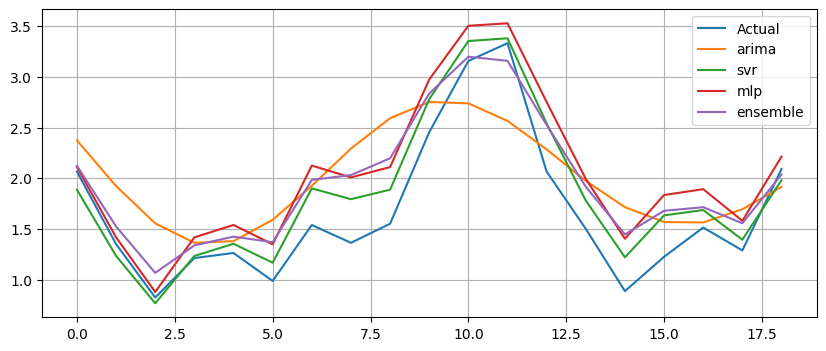

Generation 84: Fitness = 2.21736




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.7289847605488975
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0726795139974783
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6318560517500154
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1896874681393177
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0837833393187386
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6295106275205469
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7502209163707863
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0871067526757754
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.7621585356855167
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0777644414676195
SVRModel {'kernel': 'poly', 'c': 70.29300183871996, 'gamma': 'scale', 'epsilon': 0.338276269734622} Fitness: 1.440802697213757
SVRModel {'kernel': 'rbf', 'c': 70.29300183871996, 'gamma': 'scale', 'epsilon': 0.338276269734622} Fitness: 1.4858890659797532
SVRModel {'kernel': 'linear', 'c': 69.8175501245555, 'gamma': 'scale', 'epsilon': 0.3293996894908885} Fitn

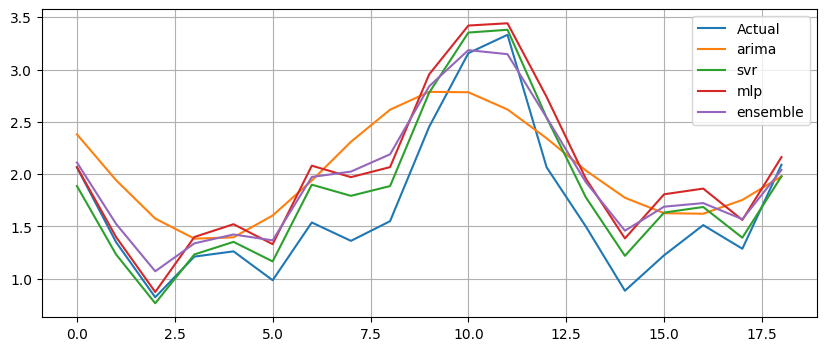

Generation 85: Fitness = 2.19686




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0726795139974783
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7496372509407836
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0865883234430118
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.075322486683024
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0876167644011225
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.627662757408289
ArimaModel {'p': 4, 'd': 1, 'q': 0} Fitness: 1.5671861207666204
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0887753378638632
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0913729131905838
ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.0802566716814004
SVRModel {'kernel': 'rbf', 'c': 70.29300183871996, 'gamma': 'scale', 'epsilon': 0.338276269734622} Fitness: 1.4858890659797532
SVRModel {'kernel': 'poly', 'c': 73.23839379814707, 'gamma': 'scale', 'epsilon': 0.338276269734622} Fitness: 1.436030606530922
SVRModel {'kernel': 'rbf', 'c': 70.06649646413243, 'gamma': 'scale', 'epsilon': 0.335214062712658} Fitness: 

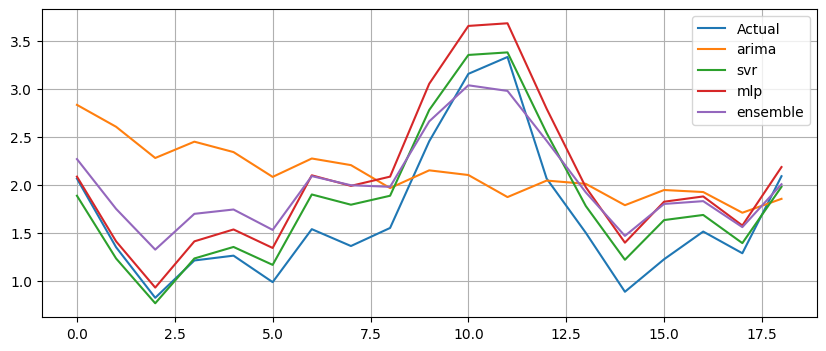

Generation 86: Fitness = 1.96938




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7496965202744812
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0857959138460085
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.083735965310942
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0915255093157972
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.7684024381097045
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0756368008433332
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.194536502142445
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.7717465878522543
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7498248658386046
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.230973906268432
SVRModel {'kernel': 'poly', 'c': 70.29300183871996, 'gamma': 'scale', 'epsilon': 0.33596177398956} Fitness: 1.4416697419808995
SVRModel {'kernel': 'linear', 'c': 70.29300183871996, 'gamma': 'scale', 'epsilon': 0.33596177398956} Fitness: 3.4784914842128134
SVRModel {'kernel': 'linear', 'c': 70.29300183871996, 'gamma': 'scale', 'epsilon': 0.33596177398956} Fitnes

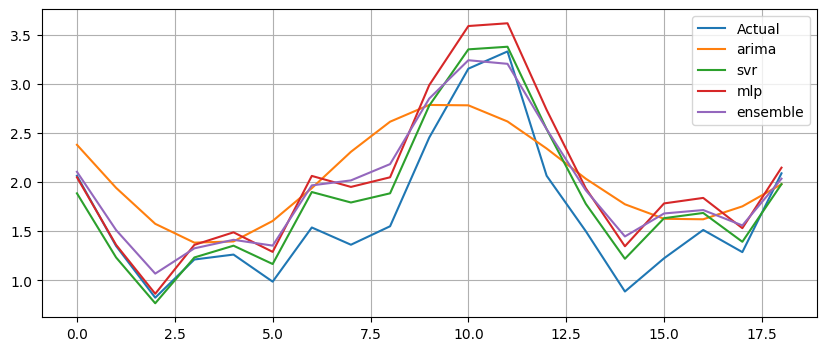

Generation 87: Fitness = 2.23562




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7484982205668278
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7464403666279276
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0876167644011225
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.750561953681944
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.091462219498243
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.228430833394746
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7515056947278411
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6287383442295356
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0700712100815444
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0694867436658138
SVRModel {'kernel': 'poly', 'c': 70.43967127839957, 'gamma': 'scale', 'epsilon': 0.3351032402618339} Fitness: 1.4399905621521751
SVRModel {'kernel': 'poly', 'c': 71.23723144674483, 'gamma': 'scale', 'epsilon': 0.3351775041701927} Fitness: 1.4540392929036052
SVRModel {'kernel': 'linear', 'c': 70.29300183871996, 'gamma': 'scale', 'epsilon': 0.33596177398956} Fitn

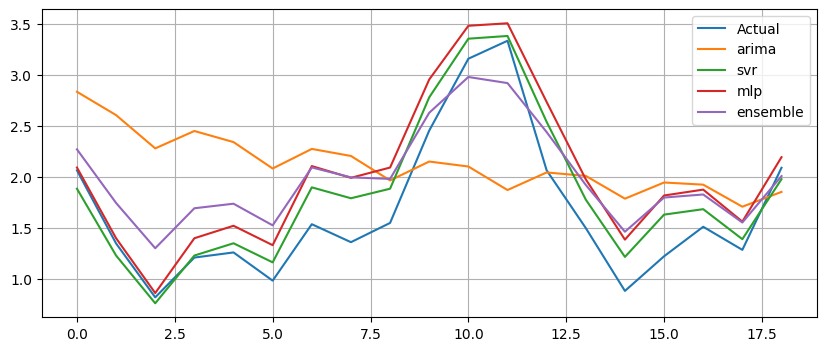

Generation 88: Fitness = 1.96575




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.8992813703169222
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0760864349439596
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0683592428680264
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.8226905018438897
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0693673443123772
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.901903854033419
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6290230869401787
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0749484434597654
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0814136071308562
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0753975227304966
SVRModel {'kernel': 'poly', 'c': 71.31200361528225, 'gamma': 'scale', 'epsilon': 0.335214062712658} Fitness: 1.4614283343051062
SVRModel {'kernel': 'rbf', 'c': 71.31200361528225, 'gamma': 'scale', 'epsilon': 0.335214062712658} Fitness: 1.4957179396565548
SVRModel {'kernel': 'rbf', 'c': 69.47144031893583, 'gamma': 'scale', 'epsilon': 0.31637012843670453} Fitne

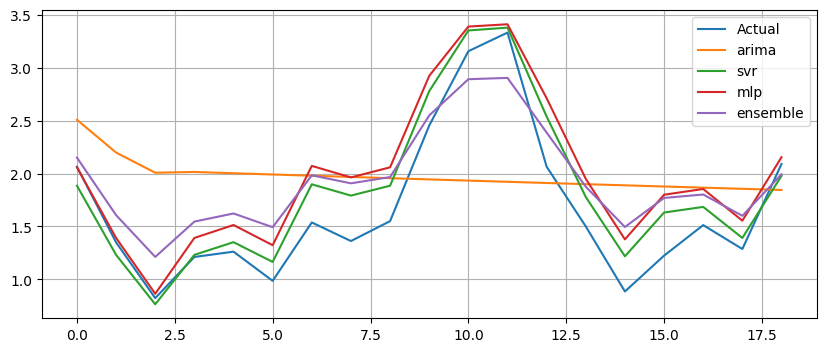

Generation 89: Fitness = 2.17120




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0850320336124462
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7513691518016898
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7514184923777052
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.9208267598724158
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6349755718314587
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0748531323606842
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.077144672252211
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0714025492805248
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.2220578413217005
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.2172201039370707
SVRModel {'kernel': 'linear', 'c': 72.50969684505488, 'gamma': 'scale', 'epsilon': 0.3359067843537215} Fitness: 3.4769133667912366
SVRModel {'kernel': 'poly', 'c': 63.388054113281555, 'gamma': 'scale', 'epsilon': 0.3362354082244432} Fitness: 1.4290155178829673
SVRModel {'kernel': 'poly', 'c': 70.47261894283876, 'gamma': 'scale', 'epsilon': 0.33730991385867537

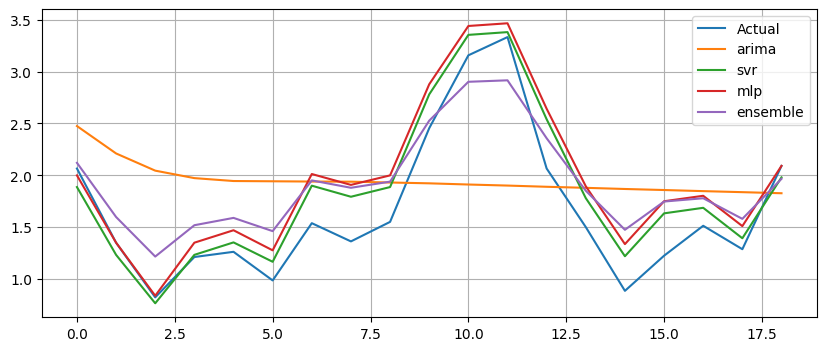

Generation 90: Fitness = 2.28962




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0779602578685974
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.746234554514249
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0747209495048862
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2485747948551356
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0721851016597865
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.2430319288602039
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.9205132670903058
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6312060088716427
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.9043725393333242
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0754352362879673
SVRModel {'kernel': 'rbf', 'c': 69.47190837769992, 'gamma': 'scale', 'epsilon': 0.33730991385867537} Fitness: 1.5034089290149488
SVRModel {'kernel': 'poly', 'c': 70.47215088407468, 'gamma': 'scale', 'epsilon': 0.31637012843670453} Fitness: 1.4476545511168264
SVRModel {'kernel': 'rbf', 'c': 69.47144031893583, 'gamma': 'scale', 'epsilon': 0.32998331021990585} F

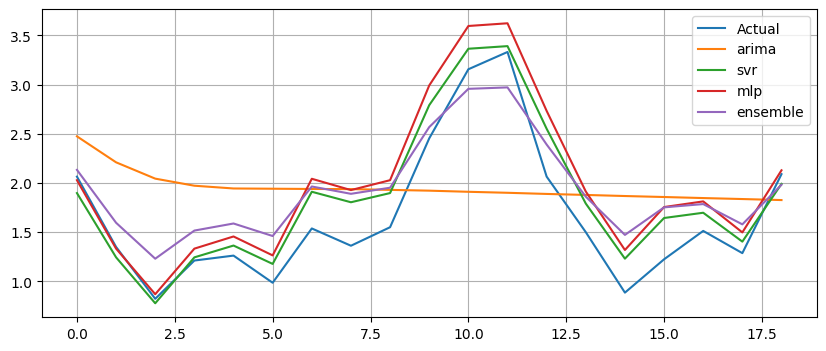

Generation 91: Fitness = 2.28805




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.075247222559298
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2348088545307556
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.068927842691852
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.2230478598766248
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0746821606472643
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1903853681056398
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0379169768479657
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7536879693165686
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.9049534498553033
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6345063950236913
SVRModel {'kernel': 'rbf', 'c': 63.617900777602394, 'gamma': 'scale', 'epsilon': 0.33585675474745963} Fitness: 1.4828277051054535
SVRModel {'kernel': 'rbf', 'c': 70.24277227851793, 'gamma': 'scale', 'epsilon': 0.3355471532285709} Fitness: 1.4758577856460144
SVRModel {'kernel': 'rbf', 'c': 72.50969684505488, 'gamma': 'scale', 'epsilon': 0.32450923188912745} Fit

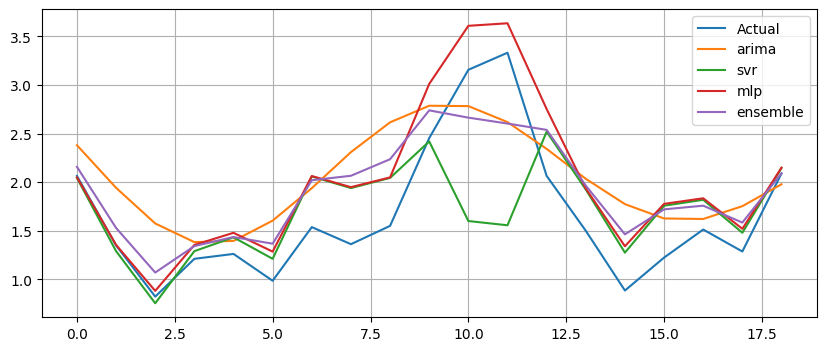

Generation 92: Fitness = 1.92094




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.185946280071649
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7514737703913272
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0691075748376233
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0771232669721045
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2412266490029498
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.2202898402406432
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.08164541834968
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.223226022801753
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6358317565284162
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.631212991750776
SVRModel {'kernel': 'poly', 'c': 70.06649646413243, 'gamma': 'scale', 'epsilon': 0.33820969558697644} Fitness: 1.3534052605356501
SVRModel {'kernel': 'poly', 'c': 70.06649646413243, 'gamma': 'scale', 'epsilon': 0.34080823295783635} Fitness: 1.4308526123047627
SVRModel {'kernel': 'rbf', 'c': 69.61918444921284, 'gamma': 'scale', 'epsilon': 0.3355471532285709} Fitne

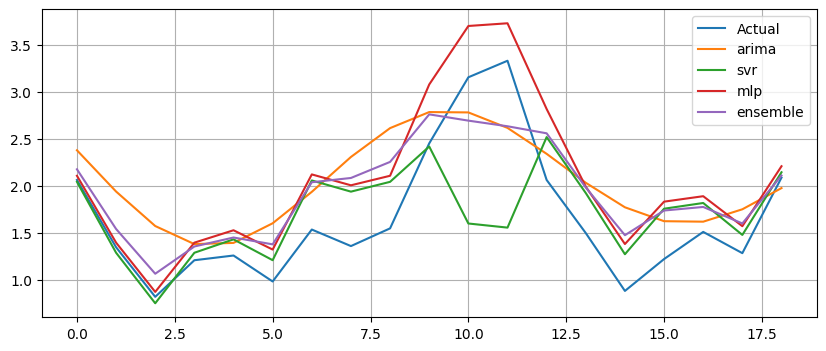

Generation 93: Fitness = 1.88848




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6349491664269062
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.2294874074045739
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0753739183324047
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6375655360375698
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7540816624793325
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.9064128966186429
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0851994888894072
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.071339746578333
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.036360462110056
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.2148154449359467
SVRModel {'kernel': 'rbf', 'c': 64.97621393556796, 'gamma': 'scale', 'epsilon': 0.32740941068922} Fitness: 1.470004392430926
SVRModel {'kernel': 'rbf', 'c': 72.50969684505488, 'gamma': 'scale', 'epsilon': 0.33030111259432354} Fitness: 1.4771092006120679
SVRModel {'kernel': 'rbf', 'c': 68.741091426584, 'gamma': 'scale', 'epsilon': 0.33585675474745963} Fitness: 

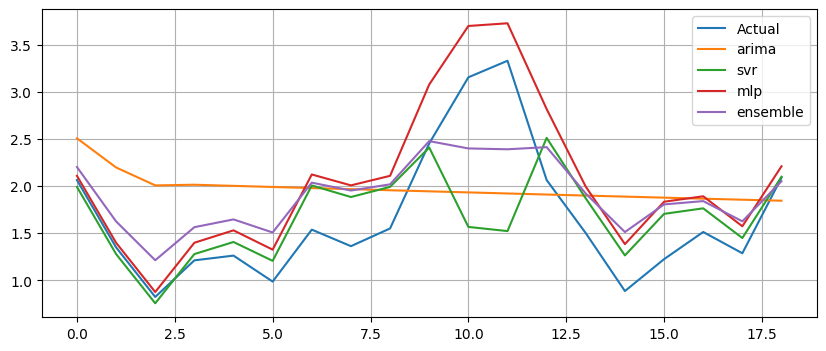

Generation 94: Fitness = 1.77628




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7514073251606286
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0391138847118142
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.2279779983518901
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.2275903739043736
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.078730465101287
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1550448013459607
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6321680258215456
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0387130015183594
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.631845950954591
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0684254191437028
SVRModel {'kernel': 'poly', 'c': 70.00891203542278, 'gamma': 'scale', 'epsilon': 0.33883749926711415} Fitness: 1.4298245902920286
SVRModel {'kernel': 'rbf', 'c': 69.95650527746582, 'gamma': 'scale', 'epsilon': 0.33718521969981996} Fitness: 1.504477949131126
SVRModel {'kernel': 'rbf', 'c': 69.50946644249801, 'gamma': 'scale', 'epsilon': 0.3401274811929449} Fitn

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


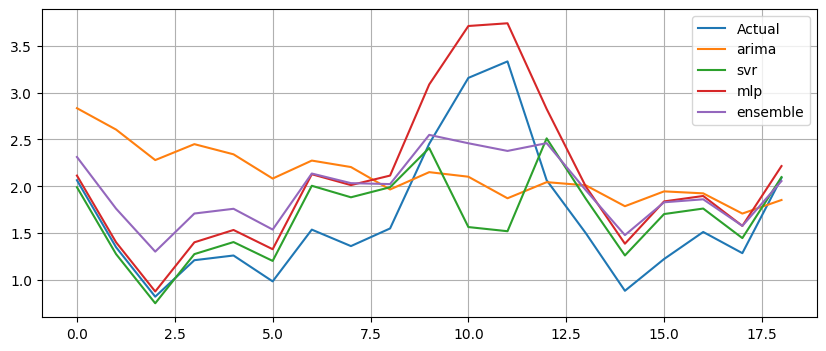

Generation 95: Fitness = 1.67855




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1552985397043523
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0779717209996498
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.076964104232421
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.07707134987723
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.9046238442297811
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.635340607655527
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0768079269656976
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.086289931419563
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.6986436346224218
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1506341661197141
SVRModel {'kernel': 'rbf', 'c': 65.50921781286964, 'gamma': 'scale', 'epsilon': 0.3160380172010067} Fitness: 1.4645364425868446
SVRModel {'kernel': 'rbf', 'c': 67.94533276454436, 'gamma': 'scale', 'epsilon': 0.33669806722184226} Fitness: 1.501080706161453
SVRModel {'kernel': 'rbf', 'c': 69.20868553419785, 'gamma': 'scale', 'epsilon': 0.3403824717596648} Fitness: 

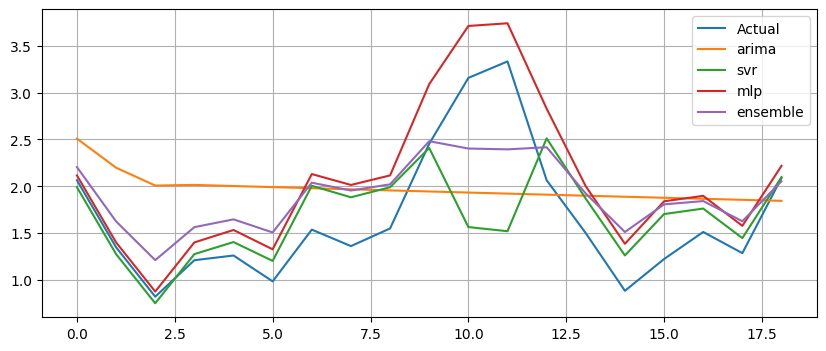

Generation 96: Fitness = 1.77612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.6975264952743898
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.086857081984109
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0758552001558692
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7521412896335467
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7447018460711332
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0763044659508205
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7518659738576066
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.0891816249344917
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0308953486565906
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.084746949432995
SVRModel {'kernel': 'poly', 'c': 69.50946644249801, 'gamma': 'scale', 'epsilon': 0.33982433846230325} Fitness: 1.4027189122316697
SVRModel {'kernel': 'rbf', 'c': 69.20868553419785, 'gamma': 'scale', 'epsilon': 0.33980257816588466} Fitness: 1.507540612464658
SVRModel {'kernel': 'rbf', 'c': 68.16334239922219, 'gamma': 'scale', 'epsilon': 0.33883749926711415} Fit

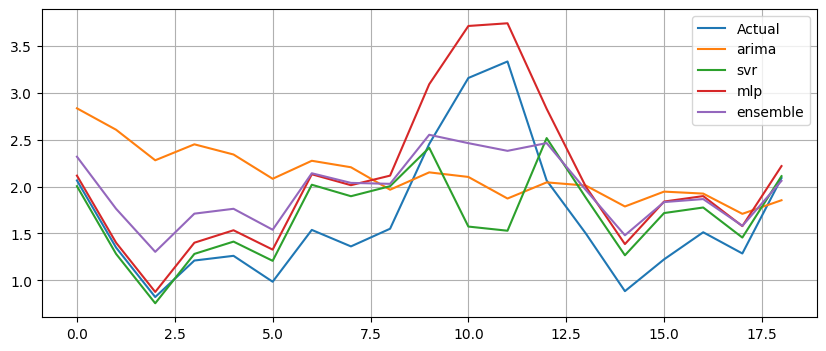

Generation 97: Fitness = 1.67171




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0762879971299535
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6974358246658445
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0383504605480418
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.073957012315175
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0393529287011334
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.0664894444793311
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7541428812220248
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7541428812220248
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1926654096254103
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.068152765597721
SVRModel {'kernel': 'rbf', 'c': 69.32145935288949, 'gamma': 'scale', 'epsilon': 0.33883749926711415} Fitness: 1.495072530567104
SVRModel {'kernel': 'rbf', 'c': 70.00891203542278, 'gamma': 'scale', 'epsilon': 0.33883749926711415} Fitness: 1.4956109894879352
SVRModel {'kernel': 'rbf', 'c': 70.00891203542278, 'gamma': 'scale', 'epsilon': 0.33883749926711415} Fitn

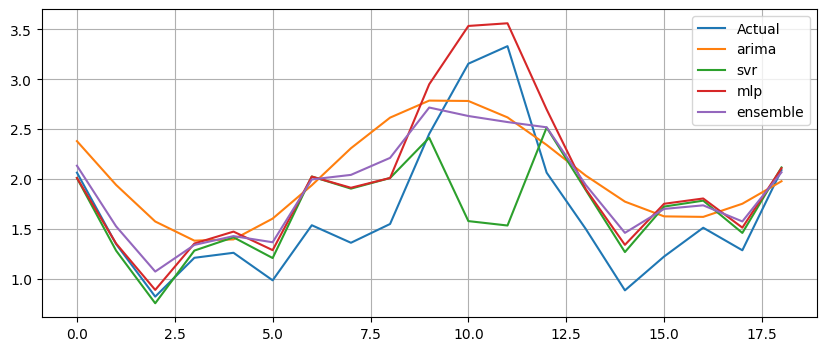

Generation 98: Fitness = 1.94569




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0683197502153123
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6940010532804703
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.18770838739055
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.075614153141713
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1963646822350102
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6367742093419348
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.0864353276638674
ArimaModel {'p': 2, 'd': 0, 'q': 4} Fitness: 1.8924828473657906
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7497114230498574
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.2468387891171933
SVRModel {'kernel': 'rbf', 'c': 69.51523648425831, 'gamma': 'scale', 'epsilon': 0.3065265677226721} Fitness: 1.4599558960661194
SVRModel {'kernel': 'rbf', 'c': 68.43900831570882, 'gamma': 'scale', 'epsilon': 0.33883749926711415} Fitness: 1.4870096613096675
SVRModel {'kernel': 'poly', 'c': 69.9799157767973, 'gamma': 'scale', 'epsilon': 0.3383993177277663} Fitnes

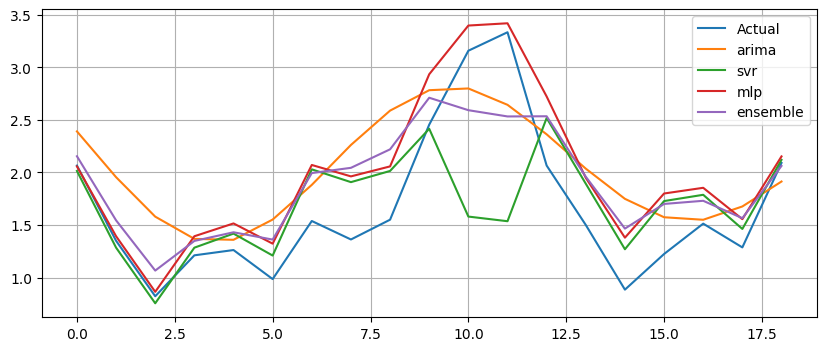

Generation 99: Fitness = 1.90302




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6974666697494143
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.7742117275571587
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7497081365599567
ArimaModel {'p': 2, 'd': 0, 'q': 4} Fitness: 1.8919081796659214
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.189451819909874
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.629802523195072
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6981457773679998
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0738673816785484
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.2598967626491326
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6375405141605746
SVRModel {'kernel': 'rbf', 'c': 69.50946644249801, 'gamma': 'scale', 'epsilon': 0.3302485445208046} Fitness: 1.4747252290342614
SVRModel {'kernel': 'poly', 'c': 69.50946644249801, 'gamma': 'scale', 'epsilon': 0.33982433846230325} Fitness: 1.4248915532930488
SVRModel {'kernel': 'poly', 'c': 70.28485087727844, 'gamma': 'scale', 'epsilon': 0.33982433846230325} Fi

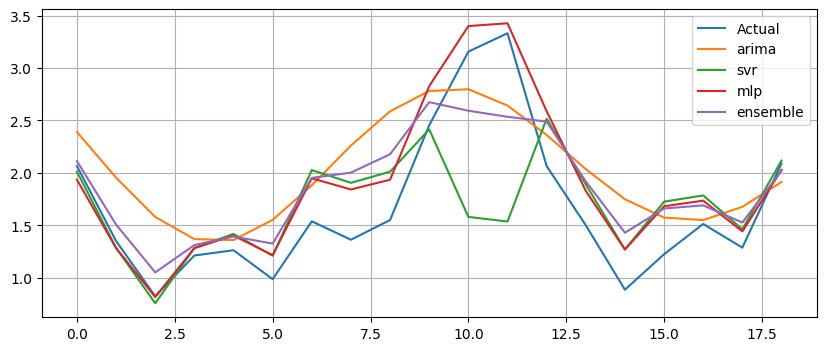

Generation 100: Fitness = 2.02570




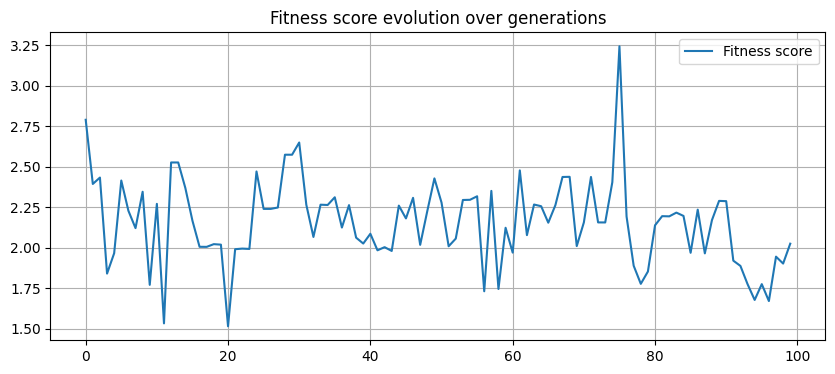

In [18]:
pool_of_models = [ArimaModel, SVRModel, MLPModel]
population_size = 10
num_generations = 100
mutation_rate = 0.2

print('Initializing population...')
population = init_population(population_size, pool_of_models)

print('Population created: ')
print_population(population)

fitness_score_collection = []

for generation in range(num_generations):

    # individual_evaluation(population, data)
    individual_evaluation_with_diversity(population, X_train_scaled, y_train_scaled, X_val_scaled, y_val_scaled)
    print_population(population)

    fitness_score, _, _, _ = team_evaluation(population, X_val_scaled, y_val_scaled)
    fitness_score_collection.append(fitness_score)

    print(f"Generation {generation + 1}: Fitness = {fitness_score:.5f}")
    print('=============================\n\n')

    # Selection by tournament
    selected_pop = random_selection(population)
    # print('selected population:')
    # print_population(selected_pop)

    # Crossover
    crossed_pop = crossover(selected_pop)
    # print('Crossed population:')
    # print_population(crossed_pop)
    
    # Mutation
    population = mutation(crossed_pop)
    # print_population(population)

plt.figure(figsize=(10, 4))
plt.plot(fitness_score_collection, label='Fitness score')
plt.title('Fitness score evolution over generations')
plt.grid()
plt.legend()
plt.show()

# Test

In [19]:
individual_evaluation_with_diversity(population, X_train_scaled, y_train_scaled, X_val_scaled, y_val_scaled)
print_population(population)


print('Best models:')
best_models = {}
# Select the best individual of each subpopulation
for model in population.keys():
    best_ind = None
    for individual in population[model]:
        best_ind = individual if best_ind is None or individual.fitness_score > best_ind.fitness_score else best_ind
    
    best_models[best_ind.get_name()] = best_ind

best_models

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.745865455594732
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.2467131629348613
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.246011003620127
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6909180010743379
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1936725764400844
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.254213302683589
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7549465514263618
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.8176313963659663
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.7549000473574967
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.1881016352502614
SVRModel {'kernel': 'poly', 'c': 70.28485087727844, 'gamma': 'scale', 'epsilon': 0.33982433846230325} Fitness: 1.447098515342489
SVRModel {'kernel': 'poly', 'c': 69.9799157767973, 'gamma': 'scale', 'epsilon': 0.3383993177277663} Fitness: 1.305299262303732
SVRModel {'kernel': 'poly', 'c': 69.50946644249801, 'gamma': 'scale', 'epsilon': 0.3302485445208046} Fitnes

{'arima': ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.254213302683589,
 'svr': SVRModel {'kernel': 'rbf', 'c': 69.50946644249801, 'gamma': 'scale', 'epsilon': 0.33982433846230325} Fitness: 1.4809217950198978,
 'mlp': MLPModel {'hidden_layer_sizes': 15, 'learning_rate': 0.05324137175587801} Fitness: 2.743831433555232}

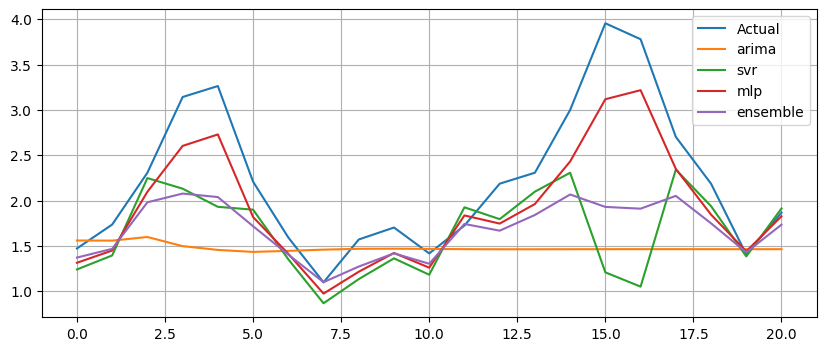

RMSE: 100.73064126226272
MSE: 10146.662089106665


In [20]:
X_train_val = pd.concat([X_train.copy(), X_val.copy()])
y_train_val = pd.concat([y_train.copy(), y_val.copy()])



X_train_scaler = StandardScaler()
y_train_scaler = StandardScaler()

X_train_scaled = X_train_scaler.fit_transform(np.array(X_train_val).reshape(-1,1))
X_test_scaled = X_train_scaler.transform(np.array(X_test).reshape(-1,1))

y_train_scaled = y_train_scaler.fit_transform(np.array(y_train_val).reshape(-1,1)).ravel()
y_test_scaled = y_train_scaler.transform(np.array(y_test).reshape(-1,1)).ravel()


models = {
    'arima': ArimaModel(ARIMA, best_models['arima'].hparams),
    'svr': SVRModel(SVR, best_models['svr'].hparams),
    'mlp': MLPModel(MLPRegressor, best_models['mlp'].hparams)
}

for model_name in models.keys():
    models[model_name].train(X_train_scaled, y_train_scaled)

ensemble = EnsembleModel(None, models)
pred = ensemble.predict(X_test_scaled)


models['ensemble'] = ensemble
plot_forecasts(models.values(), y_test_scaled)

pred_transf = X_train_scaler.inverse_transform(pred.reshape(-1,1))

mse = mean_squared_error(pred_transf, y_test)
rmse = np.sqrt(mean_squared_error(pred_transf, y_test))

print('RMSE: {}'.format(rmse))
print('MSE: {}'.format(mse))


In [25]:
from sklearn.metrics import r2_score

r2 = r2_score(y_test_scaled, pred)
print ("R2: {}".format(r2))

R2: 0.014393895124490852
